In [3]:
import matplotlib.pyplot as plt, numpy as np, os, torch, random, cv2, json
from torch import nn
from torch.utils.data import DataLoader, Dataset
import torch.nn.functional as F
from torchvision import models
from torchvision.transforms import v2 as transforms
from sklearn.metrics import accuracy_score
from tqdm import tqdm
import torch.nn as nn
import torch.optim as optim
import torch
import time
import os
import json
import torch
import torch.nn.functional as F
from torch.utils.data import Dataset
import cv2
import numpy as np
import os
import json
from pathlib import Path
import shutil
import json
import os
from pprint import pprint
import json
import os
from pathlib import Path
import shutil
import torch
import torchvision
import torchvision.transforms as T
import torchvision.models.detection
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.mask_rcnn import MaskRCNNPredictor
import numpy as np
import os
import json
from PIL import Image
from tqdm import tqdm
import cv2
import random
from ultralytics import YOLO
import matplotlib.patches as patches
from torch.utils.data import DataLoader, Dataset
from pycocotools.coco import COCO


random.seed(42)

## Load dataset

**Tip**: since the images are very big, resize the dataset before loading it to save time and memory during training (use cubic interpolation to preserve image quality when downsizing the images)!

In [5]:
# Normalize images

'''data_aug = transforms.Compose([
    transforms.ToImage(),
    transforms.Resize((256, 256)),
    transforms.CenterCrop((224, 224)),
    transforms.ToDtype(torch.float32, scale=True),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])'''

data_aug = transforms.Compose([
    transforms.ToImage(),    
    transforms.Resize((256, 256)),
    #transforms.CenterCrop((224, 224)),
    #transforms.RandomHorizontalFlip(),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
    transforms.ToDtype(torch.float32, scale=True),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
])

data_in = transforms.Compose([
    transforms.ToImage(),
    transforms.Resize((256, 256)),
    #transforms.CenterCrop((224, 224)),
    transforms.ToDtype(torch.float32, scale=True),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

In [10]:
class ChessRecognitionDataset(Dataset):
    def __init__(self, root_dir, partition, transform=None):
        self.root_dir = root_dir
        self.transform = transform

        with open(os.path.join(root_dir, 'annotations.json'), 'r') as f:
            anns = json.load(f)

        self.categories = anns['categories']
        self.cat_to_id = {c['name']: c['id'] for c in self.categories}
        self.empty_cat_id = self.cat_to_id['empty']

        self.images = anns['images']
        self.annotations = anns['annotations']['pieces']
        self.split_ids = anns['splits']['chessred2k'][partition]['image_ids']

        # Filter images based on split_ids
        self.images = [img for img in self.images if img['id'] in self.split_ids]
        self.image_id_to_path = {img['id']: img['path'] for img in self.images}

        # Group pieces by image_id
        self.anns_by_image = {img_id: [] for img_id in self.split_ids}
        for ann in self.annotations:
            if ann['image_id'] in self.anns_by_image:
                self.anns_by_image[ann['image_id']].append(ann)

        self.image_ids = list(self.image_id_to_path.keys())

        self.cols = "abcdefgh"
        self.rows = "87654321"

        print(f"Number of {partition} images: {len(self.image_ids)}")

    def __len__(self):
        return len(self.image_ids)

    def chesspos_to_index(self, pos):
        col = self.cols.index(pos[0])
        row = self.rows.index(pos[1])
        return row * 8 + col

    def __getitem__(self, idx):
        img_id = self.image_ids[idx]
        img_path = os.path.join(self.root_dir, self.image_id_to_path[img_id])

        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = image.astype(np.float32) / 255.0  

        if self.transform:
            image = self.transform(image)

        # Initialize the array with the empty category ID
        board = torch.full((64,), fill_value=self.empty_cat_id, dtype=torch.long)

        for ann in self.anns_by_image[img_id]:
            pos_idx = self.chesspos_to_index(ann['chessboard_position'])
            board[pos_idx] = ann['category_id']

        board_onehot = F.one_hot(board, num_classes=len(self.categories))
        board_onehot = board_onehot.flatten().float()

        return image, board_onehot

train_dataset = ChessRecognitionDataset('', 'train', transform=data_aug)
valid_dataset = ChessRecognitionDataset('', 'val', transform=data_in)
test_dataset = ChessRecognitionDataset('', 'test', transform=data_in)

Number of train images: 1442
Number of val images: 330
Number of test images: 306


In [11]:
# get cpu or gpu device for training
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using {device} device")

# now we need to define a Dataloader, which allows us to automatically batch our inputs, do sampling and multiprocess data loading
batch_size = 32
num_workers = 0

train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers, drop_last=True)
valid_dataloader = DataLoader(valid_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers, drop_last=False)
test_dataloader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers, drop_last=False)

Using cuda device


torch.Size([32, 256, 256, 3])
torch.Size([32, 832])
tensor(8)


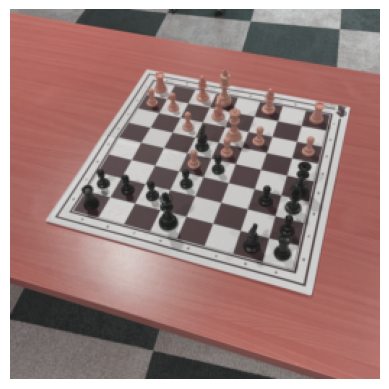

In [6]:
for batch in train_dataloader:
    # Get images of the batch and print their dimensions
    imgs = batch[0]
    imgs = imgs.permute(0, 2, 3, 1)*torch.tensor([[[0.229, 0.224, 0.225]]]) + torch.tensor([[[0.485, 0.456, 0.406]]])
    print(imgs.shape)

    # Get labels of each image in the batch and print them
    labels = batch[1]
    print(labels.shape)
    print(torch.argmax(labels[0])+1)

    # Show first image of the batch
    plt.imshow(imgs[0])
    plt.axis('off')
    plt.show()

    break

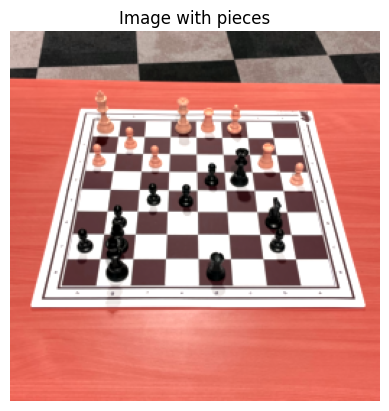

Pieces (20):
 - d8: black-rook
 - g8: black-king
 - b7: black-pawn
 - g7: black-bishop
 - h7: black-pawn
 - b6: black-knight
 - g6: black-pawn
 - e5: black-pawn
 - f5: black-pawn
 - a4: white-pawn
 - c4: black-queen
 - d4: black-pawn
 - b3: white-rook
 - f3: white-pawn
 - h3: white-pawn
 - g2: white-pawn
 - c1: white-bishop
 - d1: white-rook
 - e1: white-queen
 - h1: white-king


In [7]:
id_to_name = {c['id']: c['name'] for c in train_dataset.categories}
empty_id = train_dataset.empty_cat_id

for batch in train_dataloader:
    img_id = 31
    imgs, labels = batch

    imgs = imgs.permute(0, 2, 3, 1)
    imgs = imgs * torch.tensor([0.229, 0.224, 0.225]) + torch.tensor([0.485, 0.456, 0.406])
    imgs = imgs.clamp(0, 1)

    plt.imshow(imgs[img_id].numpy())
    plt.axis('off')
    plt.title("Image with pieces")
    plt.show()

    label = labels[img_id].view(64, -1)

    non_empty = torch.where(label.argmax(dim=1) != empty_id)[0]

    print(f"Pieces ({len(non_empty)}):")
    for i in non_empty:
        idx = i.item()
        square = chr(ord('a') + idx % 8) + str(8 - idx // 8)
        category_id = label[idx].argmax().item()
        category_name = id_to_name[category_id]
        print(f" - {square}: {category_name}")

    break


In [ ]:
# Path to annotations file
json_path = os.path.join('', 'annotations.json')

# Load JSON
with open(json_path, 'r') as f:
    anns = json.load(f)

# Index by image ID
images = anns['images']
pieces = anns['annotations']['pieces']
corners = anns['annotations'].get('corners', [])
categories = {cat['id']: cat['name'] for cat in anns['categories']}

# Select image index (e.g., the first one)
img_idx = 0
img_info = images[img_idx]
img_id = img_info['id']

print(f"\n🖼️ Image ID: {img_id}")
print(f"📂 Path: {img_info['path']}")
print(f"📏 Size: {img_info['width']} x {img_info['height']}")

# Filter annotations for this image
img_pieces = [p for p in pieces if p['image_id'] == img_id]

print(f"\n♟️ Found {len(img_pieces)} pieces in this image:\n")

for piece in img_pieces:
    bbox = piece['bbox']  # [x, y, w, h]
    cls = categories[piece['category_id']]
    pos = piece['chessboard_position']
    print(f" - {cls} at square {pos}, bbox={bbox}")

# Optionally show corners if available
img_corners = [c for c in corners if c['image_id'] == img_id]
if img_corners:
    print("\n📐 Board corner annotation (raw data):")
    pprint(img_corners[0])  
else:
    print("No corner annotation found for this image.")



🖼️ Image ID: 0
📂 Path: images/0/G000_IMG000.jpg
📏 Size: 3072 x 3072

♟️ Found 32 pieces in this image:

 - black-rook at square a8, bbox=[510.34, 963.65, 155.75, 186.14]
 - black-knight at square b8, bbox=[692.17, 877.29, 154.48, 211.46]
 - black-bishop at square c8, bbox=[877.04, 815.25, 130.42, 205.13]
 - black-queen at square d8, bbox=[1041.65, 703.82, 146.88, 264.64]
 - black-king at square e8, bbox=[1215.12, 608.85, 136.75, 303.9]
 - black-bishop at square f8, bbox=[1382.26, 631.65, 112.7, 227.92]
 - black-knight at square g8, bbox=[1536.74, 582.26, 107.63, 214.0]
 - black-rook at square h8, bbox=[1689.96, 562.0, 110.16, 176.01]
 - black-pawn at square a7, bbox=[570.61, 1114.08, 139.29, 170.94]
 - black-pawn at square b7, bbox=[774.48, 1049.5, 125.35, 153.21]
 - black-pawn at square c7, bbox=[959.35, 983.66, 111.42, 160.81]
 - black-pawn at square d7, bbox=[1149.28, 916.55, 101.3, 159.54]
 - black-pawn at square e7, bbox=[1315.15, 855.77, 101.3, 165.87]
 - black-pawn at square f7

In [9]:
# # 1. Set this to the folder containing the `annotations.json` file
# root_dir = ''

# # 2. Destination folder for YOLO dataset format
# yolo_base = 'pieces_dataset'

# # Load annotations from JSON
# with open(os.path.join(root_dir, 'annotations.json')) as f:
#     anns = json.load(f)

# # Create required directory structure
# for split in ['train', 'val', 'test']:
#     for folder in ['images', 'labels']:
#         os.makedirs(f'{yolo_base}/{folder}/{split}', exist_ok=True)

# # Prepare lookup dictionaries
# images_by_id = {img['id']: img for img in anns['images']}
# cat_id_to_name = {c['id']: c['name'] for c in anns['categories']}
# category_ids = sorted(cat_id_to_name.keys())

# # Process each split
# for split in ['train', 'val', 'test']:
#     split_ids = anns['splits']['chessred2k'][split]['image_ids']

#     for img_id in split_ids:
#         img_info = images_by_id[img_id]
#         rel_path = img_info['path']  # relative path to image file
#         abs_img_path = os.path.join(root_dir, rel_path)

#         # Extract image filename and stem
#         image_name = Path(rel_path).name
#         name_stem = Path(image_name).stem

#         # Destination paths
#         dest_img_path = f'{yolo_base}/images/{split}/{image_name}'
#         label_path = f'{yolo_base}/labels/{split}/{name_stem}.txt'

#         # Copy image to YOLO folder
#         shutil.copy(abs_img_path, dest_img_path)

#         # Write corresponding YOLO label file
#         with open(label_path, 'w') as f:
#             for ann in anns['annotations']['pieces']:
#                 if ann['image_id'] != img_id:
#                     continue

#                 x, y, w, h = ann['bbox']
#                 img_w, img_h = img_info['width'], img_info['height']

#                 # Normalize bounding box values
#                 x_center = (x + w / 2) / img_w
#                 y_center = (y + h / 2) / img_h
#                 w_norm = w / img_w
#                 h_norm = h / img_h

#                 class_id = ann['category_id']

#                 # Write label in YOLO format
#                 f.write(f"{class_id} {x_center:.6f} {y_center:.6f} {w_norm:.6f} {h_norm:.6f}\n")

In [10]:
# # === CONFIGURATION ===
# root_dir = ''  # Folder where annotations.json is located
# yolo_base = 'board_dataset'  # Destination folder for YOLO-formatted dataset
# json_file = 'annotations.json'

# # === 1. Create the required YOLO folder structure ===
# for split in ['train', 'val', 'test']:
#     for folder in ['images', 'labels']:
#         os.makedirs(f'{yolo_base}/{folder}/{split}', exist_ok=True)

# # === 2. Load the annotations from the JSON file ===
# with open(os.path.join(root_dir, json_file)) as f:
#     anns = json.load(f)

# # === 3. Create lookup dictionaries for images and category IDs ===
# images_by_id = {img['id']: img for img in anns['images']}
# cat_id_to_name = {0: 'top_left', 1: 'top_right', 2: 'bottom_left', 3: 'bottom_right'}
# category_ids = sorted(cat_id_to_name.keys())

# # === 4. Process each split (train/val/test) ===
# for split in ['train', 'val', 'test']:
#     split_ids = anns['splits']['chessred2k'][split]['image_ids']

#     for img_id in split_ids:
#         img_info = images_by_id[img_id]
#         rel_path = img_info['path']  # relative path to image
#         abs_img_path = os.path.join(root_dir, rel_path)

#         image_name = Path(rel_path).name
#         name_stem = Path(image_name).stem

#         # Define destination paths
#         dest_img_path = f'{yolo_base}/images/{split}/{image_name}'
#         label_path = f'{yolo_base}/labels/{split}/{name_stem}.txt'

#         # Copy image to YOLO folder
#         shutil.copy(abs_img_path, dest_img_path)

#         # Extract corner annotations for this image
#         img_corners = [
#             ann for ann in anns['annotations']['corners']
#             if ann['image_id'] == img_id
#         ]

#         # Write YOLO-formatted labels
#         with open(label_path, 'w') as f:
#             for ann in anns['annotations']['corners']:
#                 if ann['image_id'] != img_id:
#                     continue

#                 if 'corners' not in ann:
#                     continue

#                 for class_name, coords in ann['corners'].items():
#                     x_center, y_center = coords

#                     # Map class name to ID
#                     class_id_map = {
#                         'top_left': 0,
#                         'top_right': 1,
#                         'bottom_left': 2,
#                         'bottom_right': 3
#                     }

#                     class_id = class_id_map[class_name]
#                     img_w, img_h = img_info['width'], img_info['height']

#                     # Create small bounding box around point (10x10 pixels for example)
#                     box_w = 10
#                     box_h = 10

#                     # Normalize for YOLO
#                     x_center_norm = x_center / img_w
#                     y_center_norm = y_center / img_h
#                     w_norm = box_w / img_w
#                     h_norm = box_h / img_h

#                     f.write(f"{class_id} {x_center_norm:.6f} {y_center_norm:.6f} {w_norm:.6f} {h_norm:.6f}\n")

In [11]:
# from ultralytics import YOLO

# model = YOLO('yolov8n.pt')

# device_num = 0 if torch.cuda.is_available() else 'cpu'

# model.train(
#     data="pieces.yaml",
#     epochs=50,
#     imgsz=640,
#     batch=32,
#     name="piece_yolov8",
#     project="runs/train",
#     device=device_num,
# )

# model.train(
#     data="board.yaml",
#     epochs=50,
#     imgsz=640,
#     batch=32,
#     name="board_yolov8",
#     project="runs/train",
#     device=device_num,
# )

In [12]:
# model_pieces = YOLO("runs/train/piece_yolov8/weights/best.pt")
# piece_results  = model_pieces.predict(source="pieces_dataset/images/test", 
#                                       save=True, 
#                                       save_txt=True, 
#                                       conf=0.50, 
#                                       iou=0.45, 
#                                       device=device_num)

# detections = []
# for r in piece_results:
#     for box in r.boxes:
#         cls_id = int(box.cls)
#         label = model_pieces.names[cls_id]
#         conf = float(box.conf)
#         x1, y1, x2, y2 = box.xyxy[0].tolist()
#         x_center = (x1 + x2) / 2
#         y_center = (y1 + y2) / 2

#         print(f"Label: {label}, Confidence: {conf:.2f}, Center: ({x_center:.1f}, {y_center:.1f})")
#         detections.append({
#             "label": label,
#             "center": (x_center, y_center),
#             "bbox": [x1, y1, x2, y2]
#         })

In [13]:
# POOR RESULTS, COULD NOT DETECT CORNERS

# model_board = YOLO("runs/train/board_yolov8/weights/best.pt")
# corner_results = model_board.predict(source="board_dataset/images/test", 
#                                      save=True, 
#                                      save_txt=True, 
#                                      conf=0.50, 
#                                      iou=0.45, 
#                                      device=device_num)

# detected_corners = {}

# for box in corner_results[0].boxes:
#     cls_id = int(box.cls)
#     label = model_board.names[cls_id]
#     x1, y1, x2, y2 = box.xyxy[0]
#     x_center = (x1 + x2) / 2
#     y_center = (y1 + y2) / 2
#     detected_corners[label] = (float(x_center), float(y_center))

#     print("\n=== CORNER DETECTIONS ===")
#     for name in ['top_left', 'top_right', 'bottom_right', 'bottom_left']:
#         if name in detected_corners:
#             print(f"{name}: {detected_corners[name]}")
#         else:
#             print(f"{name}: ❌ Not detected")

In [14]:
# # === CONFIG ===
# root_dir = '' 
# json_file = 'annotations.json'
# output_dir = 'board_maskrcnn_dataset'
# os.makedirs(output_dir, exist_ok=True)

# # === Load original annotations ===
# with open(os.path.join(root_dir, json_file)) as f:
#     anns = json.load(f)

# # === Build image dict ===
# images_by_id = {img['id']: img for img in anns['images']}

# # === Process each split ===
# for split_name in ['train', 'val', 'test']:
#     print(f"\n=== Processing split: {split_name} ===")
#     split_ids = anns['splits']['chessred2k'][split_name]['image_ids']

#     # Setup COCO format dict
#     coco = {
#         "images": [],
#         "annotations": [],
#         "categories": [
#             {"id": 1, "name": "board", "supercategory": "board"}
#         ]
#     }

#     img_id_map = {}
#     coco_img_id = 0
#     anno_id = 0

#     # Process each image in the split
#     for img_id in split_ids:
#         img_info = images_by_id[img_id]
#         rel_path = img_info['path']
#         abs_img_path = os.path.join(root_dir, rel_path)

#         # === Add image entry ===
#         image_entry = {
#             "id": coco_img_id,
#             "file_name": Path(rel_path).name,
#             "width": img_info['width'],
#             "height": img_info['height']
#         }
#         coco['images'].append(image_entry)
#         img_id_map[img_id] = coco_img_id

#         # === Find corners for this image ===
#         for ann in anns['annotations']['corners']:
#             if ann['image_id'] != img_id:
#                 continue
#             if 'corners' not in ann:
#                 continue

#             corners = ann['corners']
#             # Order of points: top_left, top_right, bottom_right, bottom_left
#             segmentation = [
#                 corners['top_left'][0], corners['top_left'][1],
#                 corners['top_right'][0], corners['top_right'][1],
#                 corners['bottom_right'][0], corners['bottom_right'][1],
#                 corners['bottom_left'][0], corners['bottom_left'][1],
#             ]

#             # Compute bbox (x_min, y_min, width, height)
#             x_coords = segmentation[0::2]
#             y_coords = segmentation[1::2]
#             x_min = min(x_coords)
#             y_min = min(y_coords)
#             x_max = max(x_coords)
#             y_max = max(y_coords)
#             bbox = [x_min, y_min, x_max - x_min, y_max - y_min]

#             # Compute area (simple polygon area formula)
#             area = 0.5 * abs(
#                 x_coords[0]*y_coords[1] + x_coords[1]*y_coords[2] + x_coords[2]*y_coords[3] + x_coords[3]*y_coords[0]
#                 - y_coords[0]*x_coords[1] - y_coords[1]*x_coords[2] - y_coords[2]*x_coords[3] - y_coords[3]*x_coords[0]
#             )

#             # Add annotation entry
#             ann_entry = {
#                 "id": anno_id,
#                 "image_id": coco_img_id,
#                 "category_id": 1,
#                 "segmentation": [segmentation],
#                 "area": area,
#                 "bbox": bbox,
#                 "iscrowd": 0
#             }
#             coco['annotations'].append(ann_entry)
#             anno_id += 1

#         # === Copy image to split folder ===
#         split_img_folder = os.path.join(output_dir, f'images_{split_name}')
#         os.makedirs(split_img_folder, exist_ok=True)
#         dest_img_path = os.path.join(split_img_folder, Path(rel_path).name)
#         shutil.copy(abs_img_path, dest_img_path)

#         coco_img_id += 1

#     # === Save COCO instances json for this split ===
#     out_json_path = os.path.join(output_dir, f'instances_{split_name}.json')
#     with open(out_json_path, 'w') as f:
#         json.dump(coco, f, indent=2)

#     print(f"✅ Done {split_name}! Saved {out_json_path} with {len(coco['images'])} images and {len(coco['annotations'])} annotations.")

# NEW APPROACH: Use a CNN to detect the corners of the board, then use a perspective transform to get the board in a top-down view.

In [12]:
class ChessCornersDataset(Dataset):
    def __init__(self, root_dir, partition, transform=None):
        self.root_dir = root_dir
        self.transform = transform

        with open(os.path.join(root_dir, 'annotations.json'), 'r') as f:
            anns = json.load(f)

        self.images = anns['images']
        self.corners = anns['annotations']['corners']
        self.split_ids = anns['splits']['chessred2k'][partition]['image_ids']

        self.images = [img for img in self.images if img['id'] in self.split_ids]
        self.image_id_to_path = {img['id']: img['path'] for img in self.images}

        # Group corners by image_id
        self.corners_by_image = {}
        for ann in self.corners:
            self.corners_by_image[ann['image_id']] = ann['corners']

        self.image_ids = list(self.image_id_to_path.keys())

        print(f"Number of {partition} images (corners): {len(self.image_ids)}")

    def __len__(self):
        return len(self.image_ids)

    def __getitem__(self, idx):
        img_id = self.image_ids[idx]
        img_path = os.path.join(self.root_dir, self.image_id_to_path[img_id])

        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        orig_height, orig_width = image.shape[:2]

        image = image.astype(np.float32) / 255.0

        if self.transform:
            image = self.transform(image)

        corners_dict = self.corners_by_image[img_id]

        corners = [
            corners_dict['top_left'][0] / orig_width,
            corners_dict['top_left'][1] / orig_height,
            corners_dict['top_right'][0] / orig_width,
            corners_dict['top_right'][1] / orig_height,
            corners_dict['bottom_left'][0] / orig_width,
            corners_dict['bottom_left'][1] / orig_height,
            corners_dict['bottom_right'][0] / orig_width,
            corners_dict['bottom_right'][1] / orig_height,
        ]

        corners = torch.tensor(corners, dtype=torch.float32)

        return image, corners

In [13]:
train_dataset_corners = ChessCornersDataset('', 'train', transform=data_aug)
valid_dataset_corners = ChessCornersDataset('', 'val', transform=data_in)
test_dataset_corners = ChessCornersDataset('', 'test', transform=data_in)

batch_size = 32
num_workers = 0

train_dataloader_corners = DataLoader(train_dataset_corners, batch_size=batch_size, shuffle=True, num_workers=num_workers, drop_last=True)
valid_dataloader_corners = DataLoader(valid_dataset_corners, batch_size=batch_size, shuffle=False, num_workers=num_workers, drop_last=False)
test_dataloader_corners = DataLoader(test_dataset_corners, batch_size=batch_size, shuffle=False, num_workers=num_workers, drop_last=False)

Number of train images (corners): 1442
Number of val images (corners): 330
Number of test images (corners): 306


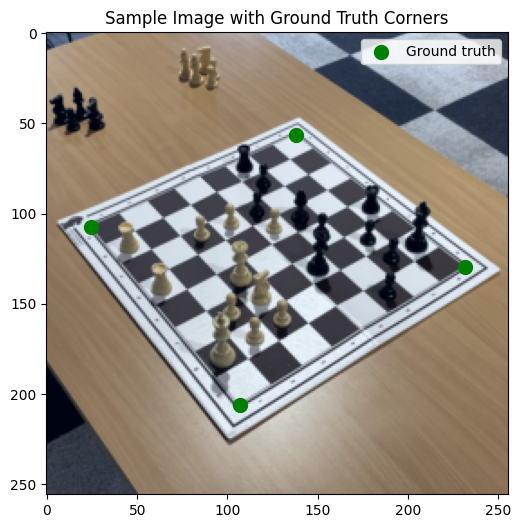

In [14]:
batch = next(iter(train_dataloader_corners))

images, targets = batch

img = images[0].permute(1,2,0).numpy()
img = (img - img.min()) / (img.max() - img.min())

img_h, img_w = img.shape[0], img.shape[1]

target_points = targets[0].view(-1, 2).numpy()
target_points[:,0] *= img_w
target_points[:,1] *= img_h

plt.figure(figsize=(6,6))
plt.imshow(img)
plt.scatter(target_points[:,0], target_points[:,1], color='green', label='Ground truth', s=100)
plt.legend()
plt.title("Sample Image with Ground Truth Corners")
plt.show()


In [15]:
backbone = models.efficientnet_b0(pretrained=True)

feature_extractor = nn.Sequential(*list(backbone.children())[:-1])  # (batch, 1280, 1, 1)

regressor = nn.Sequential(
    nn.Flatten(),
    nn.Linear(1280, 512),
    nn.ReLU(),
    nn.Linear(512, 256),
    nn.ReLU(),
    nn.Linear(256, 8),  # 8 coords
)

model = nn.Sequential(
    feature_extractor,
    regressor
)

model = model.to(device)


In [16]:
criterion = nn.MSELoss()

optimizer = optim.Adam(model.parameters(), lr=1e-4)

scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=10)

In [26]:
num_epochs = 50
patience = 5  # Early stopping patience
epochs_no_improvement = 0

train_losses = []
val_losses = []
train_maes = []
val_maes = []
best_val_loss = float('inf')

for epoch in range(num_epochs):
    ##########################
    # TRAIN LOOP
    ##########################
    model.train()
    running_loss = 0.0
    running_mae = 0.0
    
    for images, targets in tqdm(train_dataloader_corners, desc=f"Epoch {epoch+1}/{num_epochs} [Training]"):
        images = images.to(device)
        targets = targets.to(device)
        
        preds = model(images)
        loss = criterion(preds, targets)
        mae = F.l1_loss(preds, targets, reduction='mean')
        
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item() * images.size(0)
        running_mae += mae.item() * images.size(0)
    
    epoch_train_loss = running_loss / len(train_dataloader_corners.dataset)
    epoch_train_mae = running_mae / len(train_dataloader_corners.dataset)
    
    ##########################
    # VALIDATION LOOP
    ##########################
    model.eval()
    val_loss = 0.0
    val_mae = 0.0
    
    with torch.no_grad():
        for images, targets in tqdm(valid_dataloader_corners, desc=f"Epoch {epoch+1}/{num_epochs} [Validation]"):
            images = images.to(device)
            targets = targets.to(device)
            
            preds = model(images)
            loss = criterion(preds, targets)
            mae = F.l1_loss(preds, targets, reduction='mean')
            
            val_loss += loss.item() * images.size(0)
            val_mae += mae.item() * images.size(0)
    
    epoch_val_loss = val_loss / len(valid_dataloader_corners.dataset)
    epoch_val_mae = val_mae / len(valid_dataloader_corners.dataset)
    
    # Step scheduler
    scheduler.step()
    
    ##########################
    # Save metrics
    ##########################
    train_losses.append(epoch_train_loss)
    val_losses.append(epoch_val_loss)
    train_maes.append(epoch_train_mae)
    val_maes.append(epoch_val_mae)

    ##########################
    # Save best model
    ##########################

    if epoch_val_loss < best_val_loss:
        print(f"🔥 New best model found at epoch {epoch+1} with validation loss {epoch_val_loss:.6f} - saving model.")
        best_val_loss = epoch_val_loss
        os.makedirs("corners_model", exist_ok=True)
        torch.save(model.state_dict(), f"corners_model/corners_best.pth")

        epochs_no_improvement = 0  # Reset counter
    else:
        epochs_no_improvement += 1
        if epochs_no_improvement >= patience:
            print(f"⏳ Early stopping triggered after {patience} epochs without improvement.")
            break
    
    ##########################
    # Print epoch summary
    ##########################
    print(f"Epoch [{epoch+1}/{num_epochs}] - "
          f"Train Loss (MSE): {epoch_train_loss:.6f} - Train MAE: {epoch_train_mae:.6f} - "
          f"Val Loss (MSE): {epoch_val_loss:.6f} - Val MAE: {epoch_val_mae:.6f} - "
          f"LR: {scheduler.get_last_lr()[0]:.6f}")
    
os.makedirs("metrics", exist_ok=True)

np.save("metrics/train_losses.npy", np.array(train_losses))
np.save("metrics/val_losses.npy", np.array(val_losses))
np.save("metrics/train_maes.npy", np.array(train_maes))
np.save("metrics/val_maes.npy", np.array(val_maes))

print("✅ Metrics saved to 'metrics' folder.")

Epoch 1/50 [Validation]: 100%|██████████| 11/11 [01:06<00:00,  6.06s/it]


🔥 New best model found at epoch 1 with validation loss 0.054255 - saving model.
Epoch [1/50] - Train Loss (MSE): 0.109941 - Train MAE: 0.267426 - Val Loss (MSE): 0.054255 - Val MAE: 0.198098 - LR: 0.000098


Epoch 2/50 [Validation]: 100%|██████████| 11/11 [00:52<00:00,  4.75s/it]


🔥 New best model found at epoch 2 with validation loss 0.036752 - saving model.
Epoch [2/50] - Train Loss (MSE): 0.040271 - Train MAE: 0.167549 - Val Loss (MSE): 0.036752 - Val MAE: 0.153992 - LR: 0.000090


Epoch 3/50 [Validation]: 100%|██████████| 11/11 [00:47<00:00,  4.34s/it]


🔥 New best model found at epoch 3 with validation loss 0.023461 - saving model.
Epoch [3/50] - Train Loss (MSE): 0.019597 - Train MAE: 0.107606 - Val Loss (MSE): 0.023461 - Val MAE: 0.110221 - LR: 0.000079


Epoch 4/50 [Validation]: 100%|██████████| 11/11 [00:45<00:00,  4.15s/it]


🔥 New best model found at epoch 4 with validation loss 0.016508 - saving model.
Epoch [4/50] - Train Loss (MSE): 0.010337 - Train MAE: 0.076470 - Val Loss (MSE): 0.016508 - Val MAE: 0.089629 - LR: 0.000065


Epoch 5/50 [Validation]: 100%|██████████| 11/11 [00:45<00:00,  4.13s/it]


🔥 New best model found at epoch 5 with validation loss 0.014596 - saving model.
Epoch [5/50] - Train Loss (MSE): 0.007952 - Train MAE: 0.067091 - Val Loss (MSE): 0.014596 - Val MAE: 0.084180 - LR: 0.000050


Epoch 6/50 [Validation]: 100%|██████████| 11/11 [00:48<00:00,  4.37s/it]


🔥 New best model found at epoch 6 with validation loss 0.013516 - saving model.
Epoch [6/50] - Train Loss (MSE): 0.006266 - Train MAE: 0.059814 - Val Loss (MSE): 0.013516 - Val MAE: 0.078986 - LR: 0.000035


Epoch 7/50 [Validation]: 100%|██████████| 11/11 [00:44<00:00,  4.06s/it]


🔥 New best model found at epoch 7 with validation loss 0.012157 - saving model.
Epoch [7/50] - Train Loss (MSE): 0.005889 - Train MAE: 0.057527 - Val Loss (MSE): 0.012157 - Val MAE: 0.074932 - LR: 0.000021


Epoch 8/50 [Validation]: 100%|██████████| 11/11 [00:44<00:00,  4.06s/it]


🔥 New best model found at epoch 8 with validation loss 0.011428 - saving model.
Epoch [8/50] - Train Loss (MSE): 0.005164 - Train MAE: 0.054252 - Val Loss (MSE): 0.011428 - Val MAE: 0.071764 - LR: 0.000010


Epoch 9/50 [Validation]: 100%|██████████| 11/11 [00:44<00:00,  4.08s/it]


🔥 New best model found at epoch 9 with validation loss 0.011160 - saving model.
Epoch [9/50] - Train Loss (MSE): 0.004736 - Train MAE: 0.051728 - Val Loss (MSE): 0.011160 - Val MAE: 0.070865 - LR: 0.000002


Epoch 10/50 [Validation]: 100%|██████████| 11/11 [00:45<00:00,  4.09s/it]


🔥 New best model found at epoch 10 with validation loss 0.011036 - saving model.
Epoch [10/50] - Train Loss (MSE): 0.004772 - Train MAE: 0.051377 - Val Loss (MSE): 0.011036 - Val MAE: 0.070715 - LR: 0.000000


Epoch 11/50 [Validation]: 100%|██████████| 11/11 [00:45<00:00,  4.09s/it]


🔥 New best model found at epoch 11 with validation loss 0.010978 - saving model.
Epoch [11/50] - Train Loss (MSE): 0.004524 - Train MAE: 0.050828 - Val Loss (MSE): 0.010978 - Val MAE: 0.070538 - LR: 0.000002


Epoch 12/50 [Validation]: 100%|██████████| 11/11 [00:44<00:00,  4.04s/it]


🔥 New best model found at epoch 12 with validation loss 0.010940 - saving model.
Epoch [12/50] - Train Loss (MSE): 0.004873 - Train MAE: 0.052515 - Val Loss (MSE): 0.010940 - Val MAE: 0.070373 - LR: 0.000010


Epoch 13/50 [Validation]: 100%|██████████| 11/11 [00:45<00:00,  4.11s/it]


🔥 New best model found at epoch 13 with validation loss 0.010756 - saving model.
Epoch [13/50] - Train Loss (MSE): 0.004446 - Train MAE: 0.050439 - Val Loss (MSE): 0.010756 - Val MAE: 0.069346 - LR: 0.000021


Epoch 14/50 [Validation]: 100%|██████████| 11/11 [00:44<00:00,  4.08s/it]


Epoch [14/50] - Train Loss (MSE): 0.005050 - Train MAE: 0.053246 - Val Loss (MSE): 0.010961 - Val MAE: 0.071325 - LR: 0.000035


Epoch 15/50 [Validation]: 100%|██████████| 11/11 [00:44<00:00,  4.08s/it]


🔥 New best model found at epoch 15 with validation loss 0.009942 - saving model.
Epoch [15/50] - Train Loss (MSE): 0.004324 - Train MAE: 0.049944 - Val Loss (MSE): 0.009942 - Val MAE: 0.067538 - LR: 0.000050


Epoch 16/50 [Validation]: 100%|██████████| 11/11 [00:44<00:00,  4.05s/it]


🔥 New best model found at epoch 16 with validation loss 0.009231 - saving model.
Epoch [16/50] - Train Loss (MSE): 0.004052 - Train MAE: 0.048452 - Val Loss (MSE): 0.009231 - Val MAE: 0.064849 - LR: 0.000065


Epoch 17/50 [Validation]: 100%|██████████| 11/11 [00:45<00:00,  4.09s/it]


🔥 New best model found at epoch 17 with validation loss 0.008945 - saving model.
Epoch [17/50] - Train Loss (MSE): 0.003658 - Train MAE: 0.045625 - Val Loss (MSE): 0.008945 - Val MAE: 0.065546 - LR: 0.000079


Epoch 18/50 [Validation]: 100%|██████████| 11/11 [00:44<00:00,  4.06s/it]


🔥 New best model found at epoch 18 with validation loss 0.007373 - saving model.
Epoch [18/50] - Train Loss (MSE): 0.003748 - Train MAE: 0.046191 - Val Loss (MSE): 0.007373 - Val MAE: 0.056218 - LR: 0.000090


Epoch 19/50 [Validation]: 100%|██████████| 11/11 [00:45<00:00,  4.11s/it]


🔥 New best model found at epoch 19 with validation loss 0.007139 - saving model.
Epoch [19/50] - Train Loss (MSE): 0.003311 - Train MAE: 0.044304 - Val Loss (MSE): 0.007139 - Val MAE: 0.054345 - LR: 0.000098


Epoch 20/50 [Validation]: 100%|██████████| 11/11 [00:44<00:00,  4.08s/it]


🔥 New best model found at epoch 20 with validation loss 0.006258 - saving model.
Epoch [20/50] - Train Loss (MSE): 0.002750 - Train MAE: 0.039595 - Val Loss (MSE): 0.006258 - Val MAE: 0.054922 - LR: 0.000100


Epoch 21/50 [Validation]: 100%|██████████| 11/11 [00:45<00:00,  4.12s/it]


🔥 New best model found at epoch 21 with validation loss 0.005480 - saving model.
Epoch [21/50] - Train Loss (MSE): 0.002585 - Train MAE: 0.039137 - Val Loss (MSE): 0.005480 - Val MAE: 0.047766 - LR: 0.000098


Epoch 22/50 [Validation]: 100%|██████████| 11/11 [00:44<00:00,  4.07s/it]


🔥 New best model found at epoch 22 with validation loss 0.005358 - saving model.
Epoch [22/50] - Train Loss (MSE): 0.002384 - Train MAE: 0.037069 - Val Loss (MSE): 0.005358 - Val MAE: 0.047988 - LR: 0.000090


Epoch 23/50 [Validation]: 100%|██████████| 11/11 [00:45<00:00,  4.10s/it]


🔥 New best model found at epoch 23 with validation loss 0.004662 - saving model.
Epoch [23/50] - Train Loss (MSE): 0.002015 - Train MAE: 0.034410 - Val Loss (MSE): 0.004662 - Val MAE: 0.044865 - LR: 0.000079


Epoch 24/50 [Validation]: 100%|██████████| 11/11 [00:45<00:00,  4.09s/it]


🔥 New best model found at epoch 24 with validation loss 0.004255 - saving model.
Epoch [24/50] - Train Loss (MSE): 0.001805 - Train MAE: 0.032585 - Val Loss (MSE): 0.004255 - Val MAE: 0.041086 - LR: 0.000065


Epoch 25/50 [Validation]: 100%|██████████| 11/11 [00:45<00:00,  4.10s/it]


🔥 New best model found at epoch 25 with validation loss 0.003964 - saving model.
Epoch [25/50] - Train Loss (MSE): 0.001854 - Train MAE: 0.033064 - Val Loss (MSE): 0.003964 - Val MAE: 0.040031 - LR: 0.000050


Epoch 26/50 [Validation]: 100%|██████████| 11/11 [00:45<00:00,  4.12s/it]


Epoch [26/50] - Train Loss (MSE): 0.001536 - Train MAE: 0.029880 - Val Loss (MSE): 0.003996 - Val MAE: 0.039751 - LR: 0.000035


Epoch 27/50 [Validation]: 100%|██████████| 11/11 [00:45<00:00,  4.15s/it]


Epoch [27/50] - Train Loss (MSE): 0.001535 - Train MAE: 0.029808 - Val Loss (MSE): 0.004194 - Val MAE: 0.040053 - LR: 0.000021


Epoch 28/50 [Validation]: 100%|██████████| 11/11 [00:47<00:00,  4.34s/it]


Epoch [28/50] - Train Loss (MSE): 0.001343 - Train MAE: 0.028240 - Val Loss (MSE): 0.003987 - Val MAE: 0.039143 - LR: 0.000010


Epoch 29/50 [Validation]: 100%|██████████| 11/11 [00:45<00:00,  4.10s/it]


🔥 New best model found at epoch 29 with validation loss 0.003745 - saving model.
Epoch [29/50] - Train Loss (MSE): 0.001291 - Train MAE: 0.027406 - Val Loss (MSE): 0.003745 - Val MAE: 0.039209 - LR: 0.000002


Epoch 30/50 [Validation]: 100%|██████████| 11/11 [00:45<00:00,  4.12s/it]


Epoch [30/50] - Train Loss (MSE): 0.001307 - Train MAE: 0.027676 - Val Loss (MSE): 0.003855 - Val MAE: 0.039562 - LR: 0.000000


Epoch 31/50 [Validation]: 100%|██████████| 11/11 [00:45<00:00,  4.10s/it]


Epoch [31/50] - Train Loss (MSE): 0.001329 - Train MAE: 0.027602 - Val Loss (MSE): 0.003905 - Val MAE: 0.039377 - LR: 0.000002


Epoch 32/50 [Validation]: 100%|██████████| 11/11 [00:44<00:00,  4.07s/it]


Epoch [32/50] - Train Loss (MSE): 0.001376 - Train MAE: 0.027943 - Val Loss (MSE): 0.003967 - Val MAE: 0.039489 - LR: 0.000010


Epoch 33/50 [Validation]: 100%|██████████| 11/11 [00:44<00:00,  4.06s/it]


Epoch [33/50] - Train Loss (MSE): 0.001346 - Train MAE: 0.028075 - Val Loss (MSE): 0.003805 - Val MAE: 0.039155 - LR: 0.000021


Epoch 34/50 [Validation]: 100%|██████████| 11/11 [00:44<00:00,  4.08s/it]

⏳ Early stopping triggered after 5 epochs without improvement.
✅ Metrics saved to 'metrics' folder.


In [ ]:
train_losses = np.load('metrics/train_losses.npy', allow_pickle=True).tolist()
val_losses = np.load('metrics/val_losses.npy', allow_pickle=True).tolist()
train_maes = np.load('metrics/train_maes.npy', allow_pickle=True).tolist()
val_maes = np.load('metrics/val_maes.npy', allow_pickle=True).tolist()

plt.figure(figsize=(12,6))

# Plot Loss (MSE)
plt.subplot(1,2,1)
plt.plot(train_losses, label="Train Loss (MSE)")
plt.plot(val_losses, label="Validation Loss (MSE)")
plt.xlabel("Epoch")
plt.ylabel("MSE")
plt.title("Training vs Validation Loss (MSE)")
plt.legend()
plt.grid()

# Plot MAE
plt.subplot(1,2,2)
plt.plot(train_maes, label="Train MAE")
plt.plot(val_maes, label="Validation MAE")
plt.xlabel("Epoch")
plt.ylabel("MAE")
plt.title("Training vs Validation MAE")
plt.legend()
plt.grid()

plt.tight_layout()
plt.show()

In [28]:
# LOAD MODEL
model = nn.Sequential(
    feature_extractor,
    regressor
)

model.load_state_dict(torch.load("corners_model/corners_best.pth"))
model = model.to(device)

# TEST LOOP
model.eval()

all_images = []
all_preds = []
all_targets = []
all_maes = []

with torch.no_grad():
    for images, targets in tqdm(test_dataloader_corners, desc="Test set evaluation"):
        images = images.to(device)
        targets = targets.to(device)
        
        preds = model(images)
        loss = criterion(preds, targets)
        
        batch_mae = F.l1_loss(preds, targets, reduction='none') 
        batch_mae = batch_mae.mean(dim=1)  
        
        all_images.append(images.cpu())
        all_preds.append(preds.cpu())
        all_targets.append(targets.cpu())
        all_maes.append(batch_mae.cpu())

all_images = torch.cat(all_images)
all_preds = torch.cat(all_preds)
all_targets = torch.cat(all_targets)
all_maes = torch.cat(all_maes)

test_loss = F.mse_loss(all_preds, all_targets, reduction='mean').item()
test_mae = F.l1_loss(all_preds, all_targets, reduction='mean').item()

print(f"\n✅ FINAL TEST RESULTS:")
print(f"Test Loss (MSE): {test_loss:.6f}")
print(f"Test MAE: {test_mae:.6f}")


Test set evaluation: 100%|██████████| 10/10 [00:47<00:00,  4.79s/it]


✅ FINAL TEST RESULTS:
Test Loss (MSE): 0.001599
Test MAE: 0.029846


# WE PLOTTED SOME IMAGES TO SEE IF THE CORNERS ARE DETECTED CORRECTLY, AND THEY ARE NOT. AND WE SAW THAT THE ORIGINAL LABELS WERE NOT CORRECT, SO WE INVESTIGATED AND FOUND THAT WE WERE DOING RESIZING AND CROPPING WITHOUT FIXING THE LABELS, SO WE TRAINED A NEW MODEL TO DETECT THE CORNERS OF THE BOARD.

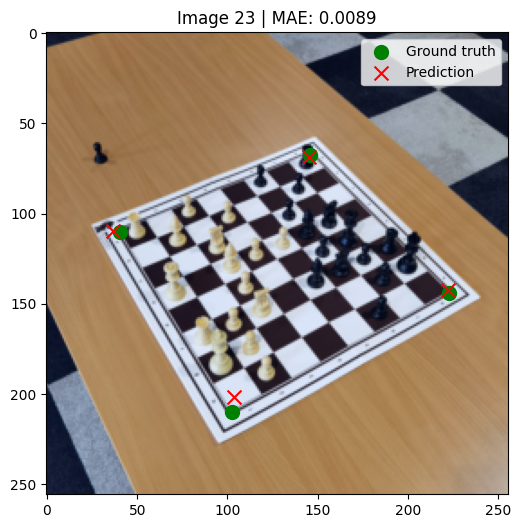

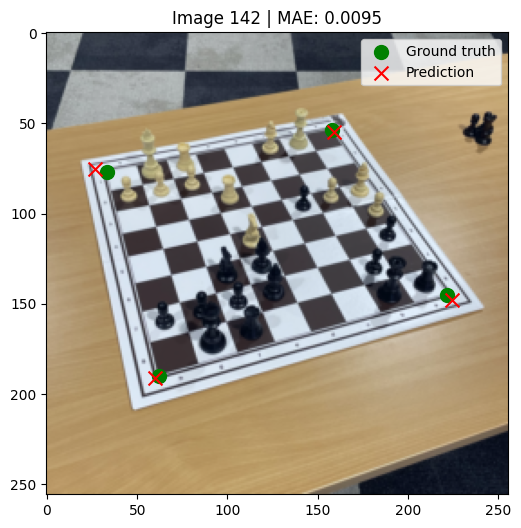

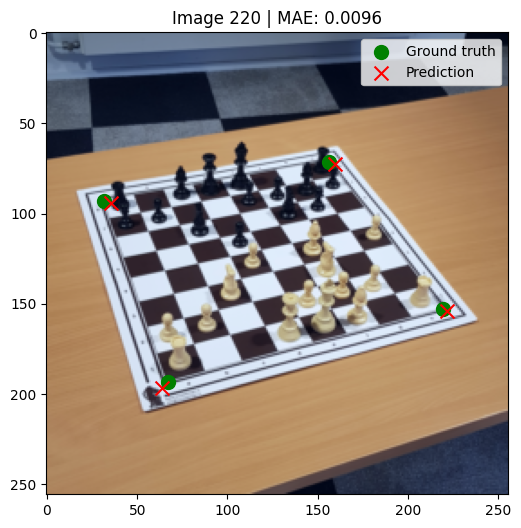

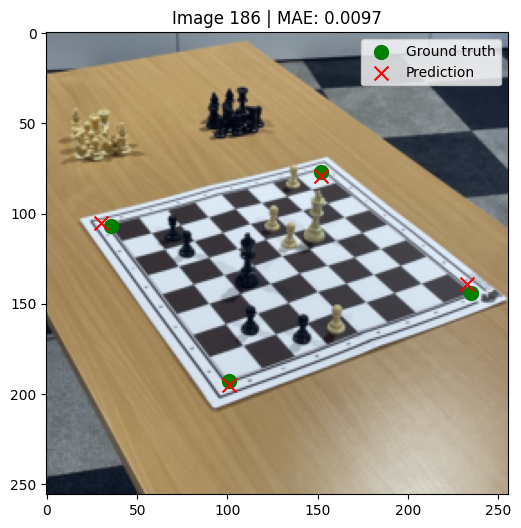

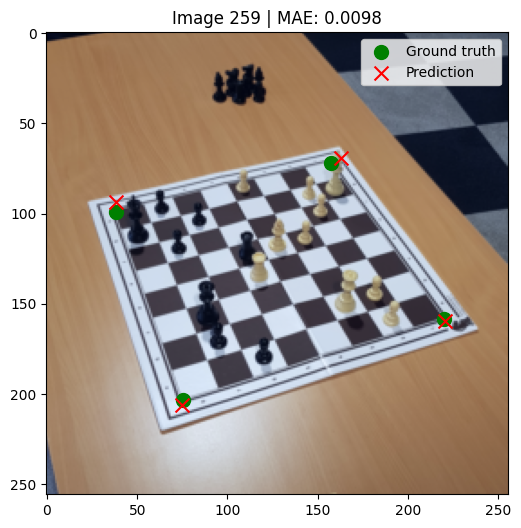

...

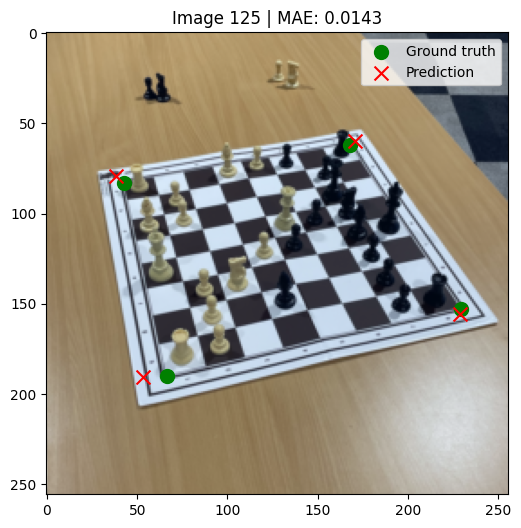

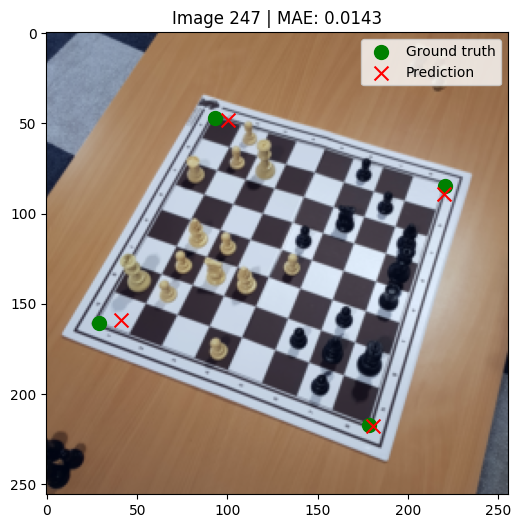

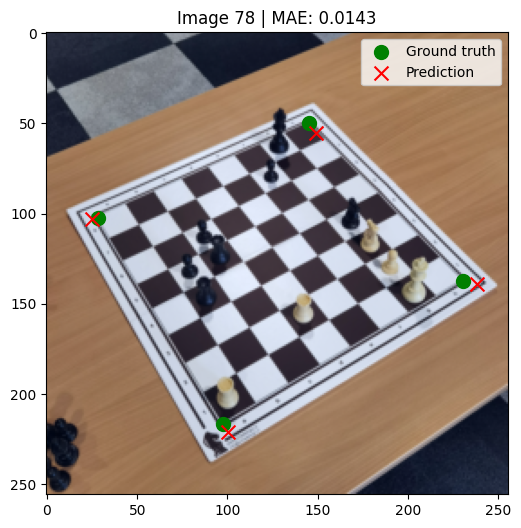

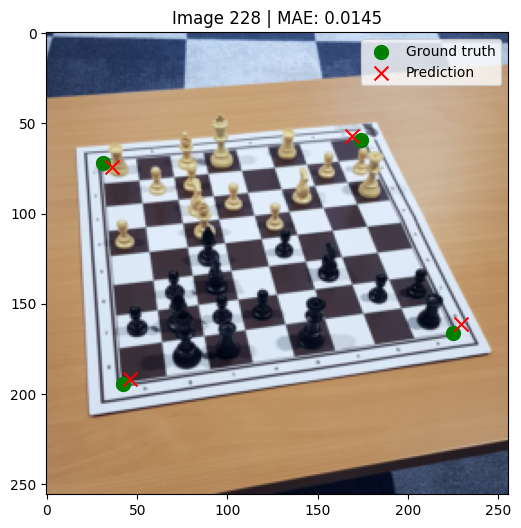

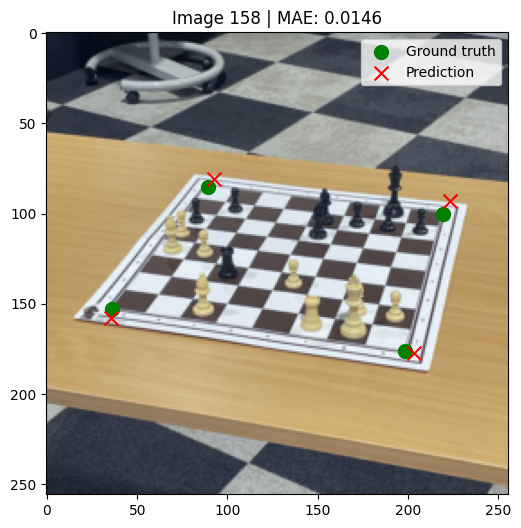

In [ ]:
n_show = 5
sorted_indices = torch.argsort(all_maes, descending=False)

for i in range(n_show):
    idx = sorted_indices[i].item()
    img = all_images[idx].permute(1, 2, 0).numpy()  # CHW → HWC
    img = (img - img.min()) / (img.max() - img.min())

    img_h, img_w = img.shape[0], img.shape[1]
    
    pred_points = all_preds[idx].view(-1, 2).numpy()
    true_points = all_targets[idx].view(-1, 2).numpy()

    pred_points = pred_points * np.array([img_w, img_h])
    true_points = true_points * np.array([img_w, img_h])
    
    plt.figure(figsize=(6,6))
    plt.imshow(img)
    
    plt.scatter(true_points[:,0], true_points[:,1], color='green', label='Ground truth', s=100)
    
    plt.scatter(pred_points[:,0], pred_points[:,1], color='red', label='Prediction', marker='x', s=100)
    
    plt.title(f"Image {idx} | MAE: {all_maes[idx]:.4f}")
    plt.legend()
    plt.show()

# TRYING TO GET BETTER RESULTS WITH RESNET50

In [17]:
backbone = models.resnet50(pretrained=True)

feature_extractor = nn.Sequential(*list(backbone.children())[:-1]) 

regressor = nn.Sequential(
    nn.Flatten(),
    nn.Linear(2048, 512),
    nn.ReLU(),
    nn.Linear(512, 256),
    nn.ReLU(),
    nn.Linear(256, 8),  # 8 coords
)

# Full model
model = nn.Sequential(
    feature_extractor,
    regressor
)

model = model.to(device)

c:\Users\diogo\anaconda3\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [18]:
criterion = nn.SmoothL1Loss()  # Huber loss

optimizer = optim.Adam(model.parameters(), lr=1e-4)

scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=10)

In [ ]:
num_epochs = 50
patience = 5  # Early stopping patience
epochs_no_improvement = 0

train_losses = []
val_losses = []
train_maes = []
val_maes = []
best_val_loss = float('inf')

for epoch in range(num_epochs):
    ##########################
    # TRAIN LOOP
    ##########################
    model.train()
    running_loss = 0.0
    running_mae = 0.0
    
    for images, targets in tqdm(train_dataloader_corners, desc=f"Epoch {epoch+1}/{num_epochs} [Training]"):
        images = images.to(device)
        targets = targets.to(device)
        
        preds = model(images)
        loss = criterion(preds, targets)
        mae = F.l1_loss(preds, targets, reduction='mean')
        
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item() * images.size(0)
        running_mae += mae.item() * images.size(0)
    
    epoch_train_loss = running_loss / len(train_dataloader_corners.dataset)
    epoch_train_mae = running_mae / len(train_dataloader_corners.dataset)
    
    ##########################
    # VALIDATION LOOP
    ##########################
    model.eval()
    val_loss = 0.0
    val_mae = 0.0
    
    with torch.no_grad():
        for images, targets in tqdm(valid_dataloader_corners, desc=f"Epoch {epoch+1}/{num_epochs} [Validation]"):
            images = images.to(device)
            targets = targets.to(device)
            
            preds = model(images)
            loss = criterion(preds, targets)
            mae = F.l1_loss(preds, targets, reduction='mean')
            
            val_loss += loss.item() * images.size(0)
            val_mae += mae.item() * images.size(0)
    
    epoch_val_loss = val_loss / len(valid_dataloader_corners.dataset)
    epoch_val_mae = val_mae / len(valid_dataloader_corners.dataset)
    
    # Step scheduler
    scheduler.step()
    
    ##########################
    # Save metrics
    ##########################
    train_losses.append(epoch_train_loss)
    val_losses.append(epoch_val_loss)
    train_maes.append(epoch_train_mae)
    val_maes.append(epoch_val_mae)

    ##########################
    # Save best model
    ##########################

    if epoch_val_loss < best_val_loss:
        print(f"🔥 New best model found at epoch {epoch+1} with validation loss {epoch_val_loss:.6f} - saving model.")
        best_val_loss = epoch_val_loss
        os.makedirs("corners_model", exist_ok=True)
        torch.save(model.state_dict(), f"corners_model/corners_best.pth")

        epochs_no_improvement = 0  # Reset counter
    else:
        epochs_no_improvement += 1
        if epochs_no_improvement >= patience:
            print(f"⏳ Early stopping triggered after {patience} epochs without improvement.")
            break
    
    ##########################
    # Print epoch summary
    ##########################
    print(f"Epoch [{epoch+1}/{num_epochs}] - "
          f"Train Loss (HUBER): {epoch_train_loss:.6f} - Train MAE: {epoch_train_mae:.6f} - "
          f"Val Loss (HUBER): {epoch_val_loss:.6f} - Val MAE: {epoch_val_mae:.6f} - "
          f"LR: {scheduler.get_last_lr()[0]:.6f}")
    
os.makedirs("metrics", exist_ok=True)

np.save("metrics/train_losses.npy", np.array(train_losses))
np.save("metrics/val_losses.npy", np.array(val_losses))
np.save("metrics/train_maes.npy", np.array(train_maes))
np.save("metrics/val_maes.npy", np.array(val_maes))

print("✅ Metrics saved to 'metrics' folder.")

Epoch 1/50 [Validation]: 100%|██████████| 11/11 [00:50<00:00,  4.61s/it]


🔥 New best model found at epoch 1 with validation loss 0.005346 - saving model.
Epoch [1/50] - Train Loss (MSE): 0.027916 - Train MAE: 0.168751 - Val Loss (MSE): 0.005346 - Val MAE: 0.076484 - LR: 0.000098


Epoch 2/50 [Validation]: 100%|██████████| 11/11 [00:47<00:00,  4.35s/it]


🔥 New best model found at epoch 2 with validation loss 0.002294 - saving model.
Epoch [2/50] - Train Loss (MSE): 0.002522 - Train MAE: 0.054733 - Val Loss (MSE): 0.002294 - Val MAE: 0.047326 - LR: 0.000090


Epoch 3/50 [Validation]: 100%|██████████| 11/11 [00:48<00:00,  4.38s/it]


🔥 New best model found at epoch 3 with validation loss 0.001449 - saving model.
Epoch [3/50] - Train Loss (MSE): 0.001447 - Train MAE: 0.042139 - Val Loss (MSE): 0.001449 - Val MAE: 0.037480 - LR: 0.000079


Epoch 4/50 [Validation]: 100%|██████████| 11/11 [00:48<00:00,  4.39s/it]


Epoch [4/50] - Train Loss (MSE): 0.001180 - Train MAE: 0.037879 - Val Loss (MSE): 0.001544 - Val MAE: 0.038692 - LR: 0.000065


Epoch 5/50 [Validation]: 100%|██████████| 11/11 [00:48<00:00,  4.39s/it]


🔥 New best model found at epoch 5 with validation loss 0.001075 - saving model.
Epoch [5/50] - Train Loss (MSE): 0.000941 - Train MAE: 0.033575 - Val Loss (MSE): 0.001075 - Val MAE: 0.030959 - LR: 0.000050


Epoch 6/50 [Validation]: 100%|██████████| 11/11 [00:48<00:00,  4.44s/it]


🔥 New best model found at epoch 6 with validation loss 0.000957 - saving model.
Epoch [6/50] - Train Loss (MSE): 0.000608 - Train MAE: 0.027240 - Val Loss (MSE): 0.000957 - Val MAE: 0.027940 - LR: 0.000035


Epoch 7/50 [Validation]: 100%|██████████| 11/11 [00:50<00:00,  4.59s/it]


🔥 New best model found at epoch 7 with validation loss 0.000939 - saving model.
Epoch [7/50] - Train Loss (MSE): 0.000561 - Train MAE: 0.026040 - Val Loss (MSE): 0.000939 - Val MAE: 0.027385 - LR: 0.000021


Epoch 8/50 [Validation]: 100%|██████████| 11/11 [00:47<00:00,  4.33s/it]


🔥 New best model found at epoch 8 with validation loss 0.000855 - saving model.
Epoch [8/50] - Train Loss (MSE): 0.000562 - Train MAE: 0.025085 - Val Loss (MSE): 0.000855 - Val MAE: 0.026095 - LR: 0.000010


Epoch 9/50 [Validation]: 100%|██████████| 11/11 [00:47<00:00,  4.31s/it]


🔥 New best model found at epoch 9 with validation loss 0.000813 - saving model.
Epoch [9/50] - Train Loss (MSE): 0.000427 - Train MAE: 0.022626 - Val Loss (MSE): 0.000813 - Val MAE: 0.025317 - LR: 0.000002


Epoch 10/50 [Validation]: 100%|██████████| 11/11 [00:47<00:00,  4.30s/it]


🔥 New best model found at epoch 10 with validation loss 0.000803 - saving model.
Epoch [10/50] - Train Loss (MSE): 0.000499 - Train MAE: 0.024342 - Val Loss (MSE): 0.000803 - Val MAE: 0.025211 - LR: 0.000000


Epoch 11/50 [Validation]: 100%|██████████| 11/11 [00:47<00:00,  4.28s/it]


🔥 New best model found at epoch 11 with validation loss 0.000799 - saving model.
Epoch [11/50] - Train Loss (MSE): 0.000367 - Train MAE: 0.020491 - Val Loss (MSE): 0.000799 - Val MAE: 0.025300 - LR: 0.000002


Epoch 12/50 [Validation]: 100%|██████████| 11/11 [00:47<00:00,  4.33s/it]


Epoch [12/50] - Train Loss (MSE): 0.000393 - Train MAE: 0.021705 - Val Loss (MSE): 0.000827 - Val MAE: 0.025185 - LR: 0.000010


Epoch 13/50 [Validation]: 100%|██████████| 11/11 [00:47<00:00,  4.34s/it]


Epoch [13/50] - Train Loss (MSE): 0.000474 - Train MAE: 0.024078 - Val Loss (MSE): 0.000817 - Val MAE: 0.025760 - LR: 0.000021


Epoch 14/50 [Validation]: 100%|██████████| 11/11 [00:47<00:00,  4.34s/it]


🔥 New best model found at epoch 14 with validation loss 0.000784 - saving model.
Epoch [14/50] - Train Loss (MSE): 0.000479 - Train MAE: 0.023714 - Val Loss (MSE): 0.000784 - Val MAE: 0.025098 - LR: 0.000035


Epoch 15/50 [Validation]: 100%|██████████| 11/11 [00:48<00:00,  4.38s/it]


Epoch [15/50] - Train Loss (MSE): 0.000481 - Train MAE: 0.023864 - Val Loss (MSE): 0.000786 - Val MAE: 0.025812 - LR: 0.000050


Epoch 16/50 [Validation]: 100%|██████████| 11/11 [00:47<00:00,  4.32s/it]


Epoch [16/50] - Train Loss (MSE): 0.000474 - Train MAE: 0.023890 - Val Loss (MSE): 0.000873 - Val MAE: 0.027797 - LR: 0.000065


Epoch 17/50 [Validation]: 100%|██████████| 11/11 [00:48<00:00,  4.38s/it]


Epoch [17/50] - Train Loss (MSE): 0.000543 - Train MAE: 0.025791 - Val Loss (MSE): 0.000913 - Val MAE: 0.027227 - LR: 0.000079


Epoch 18/50 [Validation]: 100%|██████████| 11/11 [00:47<00:00,  4.33s/it]


Epoch [18/50] - Train Loss (MSE): 0.000384 - Train MAE: 0.021581 - Val Loss (MSE): 0.000884 - Val MAE: 0.027755 - LR: 0.000090


Epoch 19/50 [Validation]: 100%|██████████| 11/11 [00:46<00:00,  4.25s/it]

⏳ Early stopping triggered after 5 epochs without improvement.
✅ Metrics saved to 'metrics' folder.


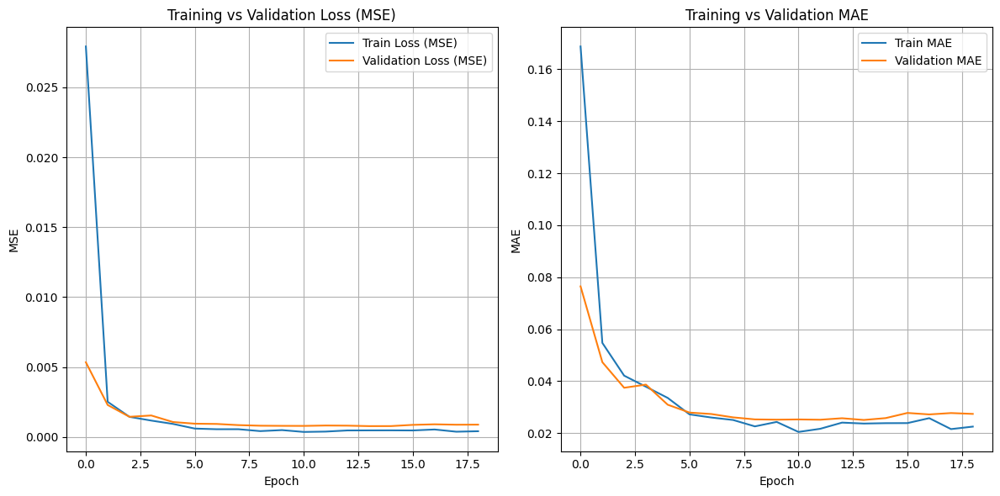

In [19]:
train_losses = np.load('metrics/train_losses.npy', allow_pickle=True).tolist()
val_losses = np.load('metrics/val_losses.npy', allow_pickle=True).tolist()
train_maes = np.load('metrics/train_maes.npy', allow_pickle=True).tolist()
val_maes = np.load('metrics/val_maes.npy', allow_pickle=True).tolist()

plt.figure(figsize=(12,6))

# Plot Loss (MSE)
plt.subplot(1,2,1)
plt.plot(train_losses, label="Train Loss (MSE)")
plt.plot(val_losses, label="Validation Loss (MSE)")
plt.xlabel("Epoch")
plt.ylabel("MSE")
plt.title("Training vs Validation Loss (MSE)")
plt.legend()
plt.grid()

# Plot MAE
plt.subplot(1,2,2)
plt.plot(train_maes, label="Train MAE")
plt.plot(val_maes, label="Validation MAE")
plt.xlabel("Epoch")
plt.ylabel("MAE")
plt.title("Training vs Validation MAE")
plt.legend()
plt.grid()

plt.tight_layout()
plt.show()

In [20]:
# LOAD MODEL
model = nn.Sequential(
    feature_extractor,
    regressor
)

model.load_state_dict(torch.load("corners_model/corners_best.pth"))
model = model.to(device)

# TEST LOOP
model.eval()

all_images_corners = []
all_preds_corners = []
all_targets_corners = []
all_maes_corners = []

with torch.no_grad():
    for images, targets in tqdm(test_dataloader_corners, desc="Test set evaluation"):
        images = images.to(device)
        targets = targets.to(device)
        
        preds = model(images)
        loss = criterion(preds, targets)
        
        batch_mae = F.l1_loss(preds, targets, reduction='none') 
        batch_mae = batch_mae.mean(dim=1)  
        
        all_images_corners.append(images.cpu())
        all_preds_corners.append(preds.cpu())
        all_targets_corners.append(targets.cpu())
        all_maes_corners.append(batch_mae.cpu())

all_images_corners = torch.cat(all_images_corners)
all_preds_corners = torch.cat(all_preds_corners)
all_targets_corners = torch.cat(all_targets_corners)
all_maes_corners = torch.cat(all_maes_corners)

test_loss = F.mse_loss(all_preds_corners, all_targets_corners, reduction='mean').item()
test_mae = F.l1_loss(all_preds_corners, all_targets_corners, reduction='mean').item()

print(f"\n✅ FINAL TEST RESULTS:")
print(f"Test Loss (MSE): {test_loss:.6f}")
print(f"Test MAE: {test_mae:.6f}")


Test set evaluation: 100%|██████████| 10/10 [00:50<00:00,  5.08s/it]


✅ FINAL TEST RESULTS:
Test Loss (MSE): 0.000770
Test MAE: 0.020532


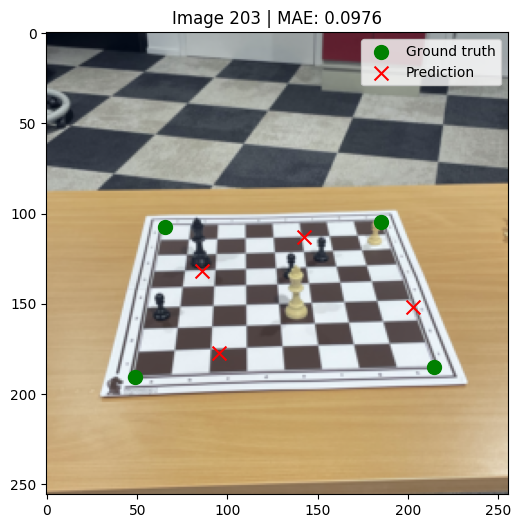

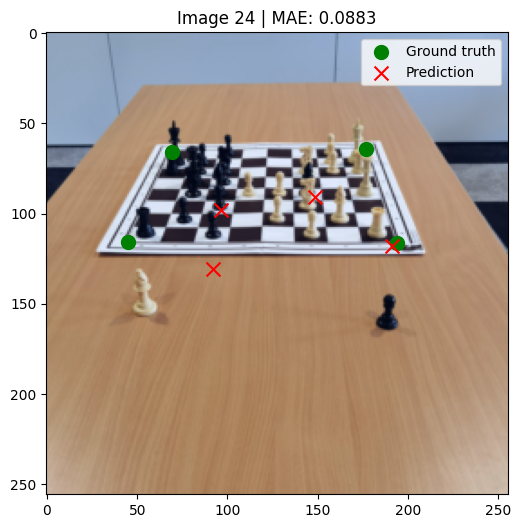

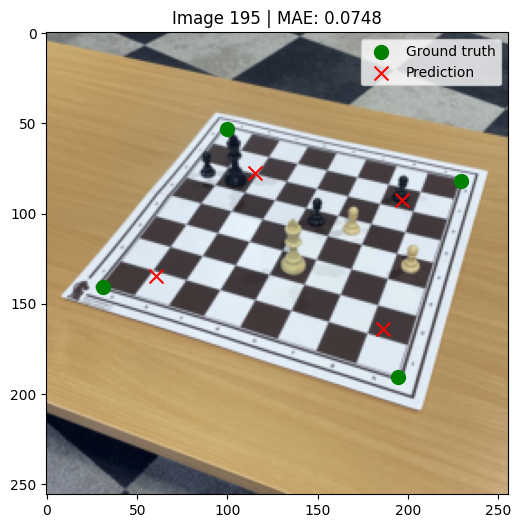

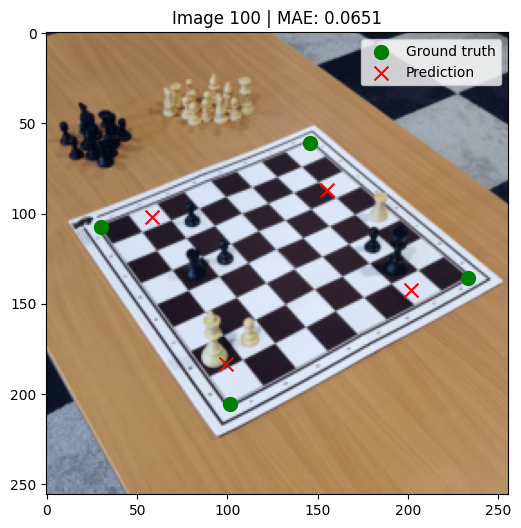

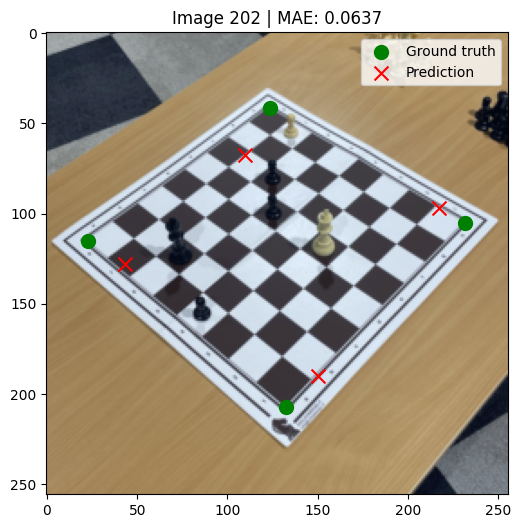

In [21]:
n_show = 5
sorted_indices = torch.argsort(all_maes_corners, descending=True)

for i in range(n_show):
    idx = sorted_indices[i].item()
    img = all_images_corners[idx].permute(1, 2, 0).numpy()  # CHW → HWC
    img = (img - img.min()) / (img.max() - img.min())

    img_h, img_w = img.shape[0], img.shape[1]
    
    pred_points_corners = all_preds_corners[idx].view(-1, 2).numpy()
    true_points_corners = all_targets_corners[idx].view(-1, 2).numpy()

    pred_points_corners = pred_points_corners * np.array([img_w, img_h])
    true_points_corners = true_points_corners * np.array([img_w, img_h])
    
    plt.figure(figsize=(6,6))
    plt.imshow(img)
    
    plt.scatter(true_points_corners[:,0], true_points_corners[:,1], color='green', label='Ground truth', s=100)
    
    plt.scatter(pred_points_corners[:,0], pred_points_corners[:,1], color='red', label='Prediction', marker='x', s=100)
    
    plt.title(f"Image {idx} | MAE: {all_maes_corners[idx]:.4f}")
    plt.legend()
    plt.show()

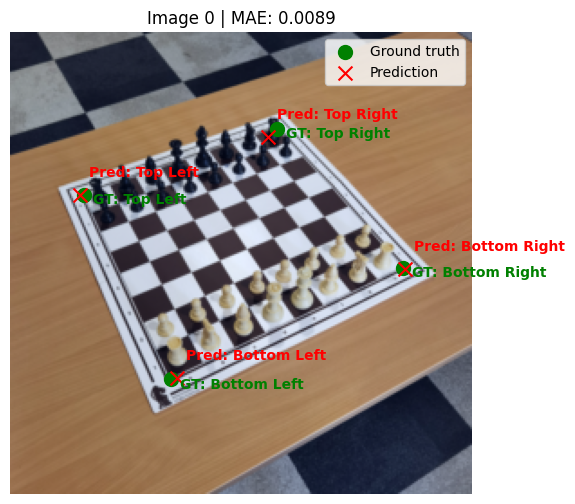

In [22]:
idx = 0

corner_labels = ["Top Left", "Top Right", "Bottom Left", "Bottom Right"]

img = all_images_corners[idx].permute(1, 2, 0).numpy()  # CHW → HWC
img = (img - img.min()) / (img.max() - img.min())

img_h, img_w = img.shape[0], img.shape[1]

pred_points_corners = all_preds_corners[idx].view(-1, 2).numpy()
true_points_corners = all_targets_corners[idx].view(-1, 2).numpy()

pred_points_corners = pred_points_corners * np.array([img_w, img_h])
true_points_corners = true_points_corners * np.array([img_w, img_h])

# Plot
plt.figure(figsize=(6,6))
plt.imshow(img)

for i in range(4):
    x, y = true_points_corners[i]
    plt.scatter(x, y, color='green', s=100, label='Ground truth' if i == 0 else "")
    plt.text(x+5, y+5, f"GT: {corner_labels[i]}", color='green', fontsize=10, weight='bold')

for i in range(4):
    x, y = pred_points_corners[i]
    plt.scatter(x, y, color='red', marker='x', s=100, label='Prediction' if i == 0 else "")
    plt.text(x+5, y-10, f"Pred: {corner_labels[i]}", color='red', fontsize=10, weight='bold')

plt.title(f"Image {idx} | MAE: {all_maes_corners[idx]:.4f}")
plt.legend()
plt.axis('off')
plt.show()


# TRY TO GEN GRID LABELS FROM THE CORNERS


In [ ]:
# Config
grid_size = 9 
root_dir = '' 
partition = 'train'

# Load annotations
with open(os.path.join(root_dir, 'annotations.json'), 'r') as f:
    anns = json.load(f)

images = anns['images']
corners_list = anns['annotations']['corners']
split_ids = anns['splits']['chessred2k'][partition]['image_ids']

# Prepare mapping
image_id_to_path = {img['id']: img['path'] for img in images}
corners_by_image = {ann['image_id']: ann['corners'] for ann in corners_list}
image_ids = [img_id for img_id in split_ids]

# Prepare grid ideal points (normalizados 0..1)
xs = np.linspace(0, 1, grid_size)
ys = np.linspace(0, 1, grid_size)
grid_points = np.array([[x, y] for y in ys for x in xs], dtype=np.float32)
grid_points_cv = grid_points.reshape(-1,1,2)

# Prepare list to store pseudo labels
all_grid_labels = []

# Process each image
for img_id in tqdm(image_ids):
    # Load image to get size
    img_path = os.path.join(root_dir, image_id_to_path[img_id])
    img = cv2.imread(img_path)
    img_h, img_w = img.shape[:2]

    # Get 4 corners
    c = corners_by_image[img_id]
    src_pts = np.array([
        c['top_left'],
        c['top_right'],
        c['bottom_left'],
        c['bottom_right']
    ], dtype=np.float32)

    # Ideal positions for homography
    dst_pts = np.array([
        [0, 0],
        [1, 0],
        [0, 1],
        [1, 1]
    ], dtype=np.float32)

    # Compute homography
    H, _ = cv2.findHomography(dst_pts, src_pts)

    # Project grid
    projected = cv2.perspectiveTransform(grid_points_cv, H)  # shape (N,1,2)
    projected = projected.reshape(-1, 2)

    # Normalize coords to [0,1] by image size
    projected[:,0] /= img_w
    projected[:,1] /= img_h

    # Flatten → [x1,y1,x2,y2,...]
    pseudo_label = projected.flatten()
    all_grid_labels.append(pseudo_label)

# Save as npy
all_grid_labels = np.stack(all_grid_labels)
os.makedirs("grid_labels", exist_ok=True)
np.save(f"grid_labels/{partition}_grid_labels.npy", all_grid_labels)

print(f"✅ Saved grid_labels/{partition}_grid_labels.npy → shape {all_grid_labels.shape}")


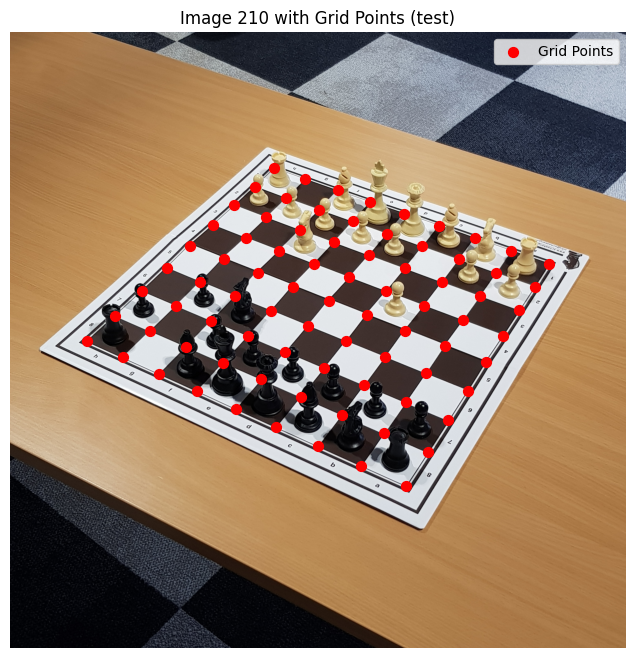

In [66]:
root_dir = ''
partition = 'test'
idx = 210

with open(os.path.join(root_dir, 'annotations.json'), 'r') as f:
    anns = json.load(f)

images = anns['images']
split_ids = anns['splits']['chessred2k'][partition]['image_ids']
image_id_to_path = {img['id']: img['path'] for img in images}
image_ids = [img_id for img_id in split_ids]

grid_labels = np.load(f"grid_labels/{partition}_grid_labels.npy")

img_id = image_ids[idx]
img_path = os.path.join(root_dir, image_id_to_path[img_id])

img = cv2.imread(img_path)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img_h, img_w = img.shape[:2]

grid_points_norm = grid_labels[idx].reshape(-1, 2)

grid_points_px = grid_points_norm.copy()
grid_points_px[:,0] *= img_w
grid_points_px[:,1] *= img_h

plt.figure(figsize=(8,8))
plt.imshow(img)
plt.scatter(grid_points_px[:,0], grid_points_px[:,1], color='red', s=50, label='Grid Points')
plt.title(f"Image {idx} with Grid Points ({partition})")
plt.legend()
plt.axis('off')
plt.show()


In [14]:
class ChessGridDataset(Dataset):
    def __init__(self, root_dir, partition, transform=None):
        self.root_dir = root_dir
        self.transform = transform

        with open(os.path.join(root_dir, 'annotations.json'), 'r') as f:
            anns = json.load(f)

        self.images = anns['images']
        self.split_ids = anns['splits']['chessred2k'][partition]['image_ids']
        self.images = [img for img in self.images if img['id'] in self.split_ids]
        self.image_id_to_path = {img['id']: img['path'] for img in self.images}
        self.image_ids = list(self.image_id_to_path.keys())

        # Load grid pseudo labels
        grid_labels_path = f"grid_labels/{partition}_grid_labels.npy"
        self.grid_labels = np.load(grid_labels_path)

        print(f"Number of {partition} images (grid): {len(self.image_ids)}")

    def __len__(self):
        return len(self.image_ids)

    def __getitem__(self, idx):
        img_id = self.image_ids[idx]
        img_path = os.path.join(self.root_dir, self.image_id_to_path[img_id])

        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = image.astype(np.float32) / 255.0

        if self.transform:
            image = self.transform(image)

        # Load corresponding pseudo-label for this idx
        grid_label = self.grid_labels[idx]
        grid_label = torch.tensor(grid_label, dtype=torch.float32)

        return image, grid_label

In [15]:
train_dataset_grid = ChessGridDataset('', 'train', transform=data_aug)
valid_dataset_grid = ChessGridDataset('', 'val', transform=data_in)
test_dataset_grid = ChessGridDataset('', 'test', transform=data_in)

batch_size = 32
num_workers = 0

train_dataloader_grid = DataLoader(train_dataset_grid, batch_size=batch_size, shuffle=True, num_workers=num_workers, drop_last=True)
valid_dataloader_grid = DataLoader(valid_dataset_grid, batch_size=batch_size, shuffle=False, num_workers=num_workers, drop_last=False)
test_dataloader_grid = DataLoader(test_dataset_grid, batch_size=batch_size, shuffle=False, num_workers=num_workers, drop_last=False)

Number of train images (grid): 1442
Number of val images (grid): 330
Number of test images (grid): 306


In [16]:
grid_size = 9 
N = grid_size * grid_size

backbone = models.efficientnet_b0(pretrained=True)
feature_extractor = nn.Sequential(*list(backbone.children())[:-1])

regressor = nn.Sequential(
    nn.Flatten(),
    nn.Linear(1280, 512),
    nn.ReLU(),
    nn.Linear(512, 256),
    nn.ReLU(),
    nn.Linear(256, N * 2),  # 2 coords per grid point
)

model = nn.Sequential(
    feature_extractor,
    regressor
)

model = model.to(device)

c:\Users\diogo\anaconda3\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_B0_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_B0_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [17]:
criterion = nn.SmoothL1Loss()  # Huber loss
optimizer = optim.Adam(model.parameters(), lr=1e-4)
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=10)

In [35]:
num_epochs = 50
patience = 5  # Early stopping patience
epochs_no_improvement = 0

train_losses = []
val_losses = []
train_maes = []
val_maes = []
best_val_loss = float('inf')

for epoch in range(num_epochs):
    ##########################
    # TRAIN LOOP
    ##########################
    model.train()
    running_loss = 0.0
    running_mae = 0.0
    
    for images, targets in tqdm(train_dataloader_grid, desc=f"Epoch {epoch+1}/{num_epochs} [Training]"):
        images = images.to(device)
        targets = targets.to(device)
        
        preds = model(images)
        loss = criterion(preds, targets)
        mae = F.l1_loss(preds, targets, reduction='mean')
        
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item() * images.size(0)
        running_mae += mae.item() * images.size(0)
    
    epoch_train_loss = running_loss / len(train_dataloader_grid.dataset)
    epoch_train_mae = running_mae / len(train_dataloader_grid.dataset)
    
    ##########################
    # VALIDATION LOOP
    ##########################
    model.eval()
    val_loss = 0.0
    val_mae = 0.0
    
    with torch.no_grad():
        for images, targets in tqdm(valid_dataloader_grid, desc=f"Epoch {epoch+1}/{num_epochs} [Validation]"):
            images = images.to(device)
            targets = targets.to(device)
            
            preds = model(images)
            loss = criterion(preds, targets)
            mae = F.l1_loss(preds, targets, reduction='mean')
            
            val_loss += loss.item() * images.size(0)
            val_mae += mae.item() * images.size(0)
    
    epoch_val_loss = val_loss / len(valid_dataloader_grid.dataset)
    epoch_val_mae = val_mae / len(valid_dataloader_grid.dataset)
    
    # Step scheduler
    scheduler.step()
    
    ##########################
    # Save metrics
    ##########################
    train_losses.append(epoch_train_loss)
    val_losses.append(epoch_val_loss)
    train_maes.append(epoch_train_mae)
    val_maes.append(epoch_val_mae)

    ##########################
    # Save best model
    ##########################

    if epoch_val_loss < best_val_loss:
        print(f"🔥 New best model found at epoch {epoch+1} with validation loss {epoch_val_loss:.6f} - saving model.")
        best_val_loss = epoch_val_loss
        os.makedirs("grid_model", exist_ok=True)
        torch.save(model.state_dict(), f"grid_model/grid_best.pth")

        epochs_no_improvement = 0  # Reset counter
    else:
        epochs_no_improvement += 1
        if epochs_no_improvement >= patience:
            print(f"⏳ Early stopping triggered after {patience} epochs without improvement.")
            break
    
    ##########################
    # Print epoch summary
    ##########################
    print(f"Epoch [{epoch+1}/{num_epochs}] - "
          f"Train Loss (HUBER): {epoch_train_loss:.6f} - Train MAE: {epoch_train_mae:.6f} - "
          f"Val Loss (HUBER): {epoch_val_loss:.6f} - Val MAE: {epoch_val_mae:.6f} - "
          f"LR: {scheduler.get_last_lr()[0]:.6f}")
    
os.makedirs("metrics_grid", exist_ok=True)

np.save("metrics_grid/train_losses.npy", np.array(train_losses))
np.save("metrics_grid/val_losses.npy", np.array(val_losses))
np.save("metrics_grid/train_maes.npy", np.array(train_maes))
np.save("metrics_grid/val_maes.npy", np.array(val_maes))

print("✅ Metrics saved to 'metrics_grid' folder.")

Epoch 1/50 [Validation]: 100%|██████████| 11/11 [00:51<00:00,  4.72s/it]


🔥 New best model found at epoch 1 with validation loss 0.015155 - saving model.
Epoch [1/50] - Train Loss (MSE): 0.058203 - Train MAE: 0.277659 - Val Loss (MSE): 0.015155 - Val MAE: 0.140202 - LR: 0.000098


Epoch 2/50 [Validation]: 100%|██████████| 11/11 [00:48<00:00,  4.40s/it]


🔥 New best model found at epoch 2 with validation loss 0.011685 - saving model.
Epoch [2/50] - Train Loss (MSE): 0.012978 - Train MAE: 0.130541 - Val Loss (MSE): 0.011685 - Val MAE: 0.123916 - LR: 0.000090


Epoch 3/50 [Validation]: 100%|██████████| 11/11 [00:49<00:00,  4.51s/it]


🔥 New best model found at epoch 3 with validation loss 0.009624 - saving model.
Epoch [3/50] - Train Loss (MSE): 0.010526 - Train MAE: 0.116894 - Val Loss (MSE): 0.009624 - Val MAE: 0.110744 - LR: 0.000079


Epoch 4/50 [Validation]: 100%|██████████| 11/11 [00:50<00:00,  4.62s/it]


🔥 New best model found at epoch 4 with validation loss 0.007878 - saving model.
Epoch [4/50] - Train Loss (MSE): 0.007990 - Train MAE: 0.099378 - Val Loss (MSE): 0.007878 - Val MAE: 0.097315 - LR: 0.000065


Epoch 5/50 [Validation]: 100%|██████████| 11/11 [00:49<00:00,  4.52s/it]


🔥 New best model found at epoch 5 with validation loss 0.005440 - saving model.
Epoch [5/50] - Train Loss (MSE): 0.005529 - Train MAE: 0.081202 - Val Loss (MSE): 0.005440 - Val MAE: 0.079068 - LR: 0.000050


Epoch 6/50 [Validation]: 100%|██████████| 11/11 [00:49<00:00,  4.54s/it]


🔥 New best model found at epoch 6 with validation loss 0.003835 - saving model.
Epoch [6/50] - Train Loss (MSE): 0.003680 - Train MAE: 0.065463 - Val Loss (MSE): 0.003835 - Val MAE: 0.063723 - LR: 0.000035


Epoch 7/50 [Validation]: 100%|██████████| 11/11 [00:49<00:00,  4.53s/it]


🔥 New best model found at epoch 7 with validation loss 0.003365 - saving model.
Epoch [7/50] - Train Loss (MSE): 0.002584 - Train MAE: 0.054498 - Val Loss (MSE): 0.003365 - Val MAE: 0.059592 - LR: 0.000021


Epoch 8/50 [Validation]: 100%|██████████| 11/11 [00:50<00:00,  4.57s/it]


🔥 New best model found at epoch 8 with validation loss 0.003157 - saving model.
Epoch [8/50] - Train Loss (MSE): 0.002286 - Train MAE: 0.050826 - Val Loss (MSE): 0.003157 - Val MAE: 0.057015 - LR: 0.000010


Epoch 9/50 [Validation]: 100%|██████████| 11/11 [00:50<00:00,  4.56s/it]


🔥 New best model found at epoch 9 with validation loss 0.003034 - saving model.
Epoch [9/50] - Train Loss (MSE): 0.002071 - Train MAE: 0.048405 - Val Loss (MSE): 0.003034 - Val MAE: 0.055444 - LR: 0.000002


Epoch 10/50 [Validation]: 100%|██████████| 11/11 [00:49<00:00,  4.52s/it]


🔥 New best model found at epoch 10 with validation loss 0.003003 - saving model.
Epoch [10/50] - Train Loss (MSE): 0.001972 - Train MAE: 0.047523 - Val Loss (MSE): 0.003003 - Val MAE: 0.055144 - LR: 0.000000


Epoch 11/50 [Validation]: 100%|██████████| 11/11 [00:50<00:00,  4.56s/it]


🔥 New best model found at epoch 11 with validation loss 0.003002 - saving model.
Epoch [11/50] - Train Loss (MSE): 0.002044 - Train MAE: 0.048068 - Val Loss (MSE): 0.003002 - Val MAE: 0.055340 - LR: 0.000002


Epoch 12/50 [Validation]: 100%|██████████| 11/11 [00:50<00:00,  4.61s/it]


Epoch [12/50] - Train Loss (MSE): 0.001917 - Train MAE: 0.046870 - Val Loss (MSE): 0.003017 - Val MAE: 0.055433 - LR: 0.000010


Epoch 13/50 [Validation]: 100%|██████████| 11/11 [00:48<00:00,  4.42s/it]


🔥 New best model found at epoch 13 with validation loss 0.002931 - saving model.
Epoch [13/50] - Train Loss (MSE): 0.001948 - Train MAE: 0.047080 - Val Loss (MSE): 0.002931 - Val MAE: 0.054468 - LR: 0.000021


Epoch 14/50 [Validation]: 100%|██████████| 11/11 [00:49<00:00,  4.53s/it]


🔥 New best model found at epoch 14 with validation loss 0.002722 - saving model.
Epoch [14/50] - Train Loss (MSE): 0.001824 - Train MAE: 0.045898 - Val Loss (MSE): 0.002722 - Val MAE: 0.052293 - LR: 0.000035


Epoch 15/50 [Validation]: 100%|██████████| 11/11 [01:02<00:00,  5.64s/it]


🔥 New best model found at epoch 15 with validation loss 0.002542 - saving model.
Epoch [15/50] - Train Loss (MSE): 0.001638 - Train MAE: 0.043354 - Val Loss (MSE): 0.002542 - Val MAE: 0.050582 - LR: 0.000050


Epoch 16/50 [Validation]: 100%|██████████| 11/11 [01:00<00:00,  5.53s/it]


🔥 New best model found at epoch 16 with validation loss 0.002407 - saving model.
Epoch [16/50] - Train Loss (MSE): 0.001587 - Train MAE: 0.042871 - Val Loss (MSE): 0.002407 - Val MAE: 0.049451 - LR: 0.000065


Epoch 17/50 [Validation]: 100%|██████████| 11/11 [01:03<00:00,  5.76s/it]


🔥 New best model found at epoch 17 with validation loss 0.002219 - saving model.
Epoch [17/50] - Train Loss (MSE): 0.001444 - Train MAE: 0.041121 - Val Loss (MSE): 0.002219 - Val MAE: 0.047091 - LR: 0.000079


Epoch 18/50 [Validation]: 100%|██████████| 11/11 [01:01<00:00,  5.62s/it]


🔥 New best model found at epoch 18 with validation loss 0.001914 - saving model.
Epoch [18/50] - Train Loss (MSE): 0.001421 - Train MAE: 0.040834 - Val Loss (MSE): 0.001914 - Val MAE: 0.044450 - LR: 0.000090


Epoch 19/50 [Validation]: 100%|██████████| 11/11 [01:01<00:00,  5.60s/it]


🔥 New best model found at epoch 19 with validation loss 0.001775 - saving model.
Epoch [19/50] - Train Loss (MSE): 0.001240 - Train MAE: 0.038243 - Val Loss (MSE): 0.001775 - Val MAE: 0.042855 - LR: 0.000098


Epoch 20/50 [Validation]: 100%|██████████| 11/11 [01:01<00:00,  5.60s/it]


Epoch [20/50] - Train Loss (MSE): 0.001147 - Train MAE: 0.036956 - Val Loss (MSE): 0.001787 - Val MAE: 0.043134 - LR: 0.000100


Epoch 21/50 [Validation]: 100%|██████████| 11/11 [01:01<00:00,  5.62s/it]


🔥 New best model found at epoch 21 with validation loss 0.001500 - saving model.
Epoch [21/50] - Train Loss (MSE): 0.001176 - Train MAE: 0.037252 - Val Loss (MSE): 0.001500 - Val MAE: 0.039571 - LR: 0.000098


Epoch 22/50 [Validation]: 100%|██████████| 11/11 [01:01<00:00,  5.57s/it]


Epoch [22/50] - Train Loss (MSE): 0.001074 - Train MAE: 0.035530 - Val Loss (MSE): 0.001592 - Val MAE: 0.041226 - LR: 0.000090


Epoch 23/50 [Validation]: 100%|██████████| 11/11 [00:48<00:00,  4.44s/it]


🔥 New best model found at epoch 23 with validation loss 0.001291 - saving model.
Epoch [23/50] - Train Loss (MSE): 0.000957 - Train MAE: 0.033773 - Val Loss (MSE): 0.001291 - Val MAE: 0.036642 - LR: 0.000079


Epoch 24/50 [Validation]: 100%|██████████| 11/11 [00:48<00:00,  4.40s/it]


Epoch [24/50] - Train Loss (MSE): 0.000913 - Train MAE: 0.032937 - Val Loss (MSE): 0.001322 - Val MAE: 0.037735 - LR: 0.000065


Epoch 25/50 [Validation]: 100%|██████████| 11/11 [00:48<00:00,  4.40s/it]


🔥 New best model found at epoch 25 with validation loss 0.001230 - saving model.
Epoch [25/50] - Train Loss (MSE): 0.000748 - Train MAE: 0.029972 - Val Loss (MSE): 0.001230 - Val MAE: 0.036386 - LR: 0.000050


Epoch 26/50 [Validation]: 100%|██████████| 11/11 [00:48<00:00,  4.40s/it]


🔥 New best model found at epoch 26 with validation loss 0.001174 - saving model.
Epoch [26/50] - Train Loss (MSE): 0.000745 - Train MAE: 0.029519 - Val Loss (MSE): 0.001174 - Val MAE: 0.035026 - LR: 0.000035


Epoch 27/50 [Validation]: 100%|██████████| 11/11 [00:48<00:00,  4.40s/it]


🔥 New best model found at epoch 27 with validation loss 0.000993 - saving model.
Epoch [27/50] - Train Loss (MSE): 0.000695 - Train MAE: 0.028601 - Val Loss (MSE): 0.000993 - Val MAE: 0.031360 - LR: 0.000021


Epoch 28/50 [Validation]: 100%|██████████| 11/11 [00:48<00:00,  4.42s/it]


Epoch [28/50] - Train Loss (MSE): 0.000675 - Train MAE: 0.028191 - Val Loss (MSE): 0.001047 - Val MAE: 0.032885 - LR: 0.000010


Epoch 29/50 [Validation]: 100%|██████████| 11/11 [00:48<00:00,  4.40s/it]


Epoch [29/50] - Train Loss (MSE): 0.000679 - Train MAE: 0.028379 - Val Loss (MSE): 0.001016 - Val MAE: 0.032313 - LR: 0.000002


Epoch 30/50 [Validation]: 100%|██████████| 11/11 [00:49<00:00,  4.46s/it]


🔥 New best model found at epoch 30 with validation loss 0.000987 - saving model.
Epoch [30/50] - Train Loss (MSE): 0.000667 - Train MAE: 0.028087 - Val Loss (MSE): 0.000987 - Val MAE: 0.031712 - LR: 0.000000


Epoch 31/50 [Validation]: 100%|██████████| 11/11 [00:48<00:00,  4.39s/it]


Epoch [31/50] - Train Loss (MSE): 0.000671 - Train MAE: 0.028123 - Val Loss (MSE): 0.001009 - Val MAE: 0.031920 - LR: 0.000002


Epoch 32/50 [Validation]: 100%|██████████| 11/11 [00:48<00:00,  4.42s/it]


Epoch [32/50] - Train Loss (MSE): 0.000680 - Train MAE: 0.028361 - Val Loss (MSE): 0.000998 - Val MAE: 0.031878 - LR: 0.000010


Epoch 33/50 [Validation]: 100%|██████████| 11/11 [00:48<00:00,  4.41s/it]


🔥 New best model found at epoch 33 with validation loss 0.000984 - saving model.
Epoch [33/50] - Train Loss (MSE): 0.000672 - Train MAE: 0.028252 - Val Loss (MSE): 0.000984 - Val MAE: 0.031545 - LR: 0.000021


Epoch 34/50 [Validation]: 100%|██████████| 11/11 [00:48<00:00,  4.42s/it]


🔥 New best model found at epoch 34 with validation loss 0.000973 - saving model.
Epoch [34/50] - Train Loss (MSE): 0.000663 - Train MAE: 0.028047 - Val Loss (MSE): 0.000973 - Val MAE: 0.031413 - LR: 0.000035


Epoch 35/50 [Validation]: 100%|██████████| 11/11 [00:48<00:00,  4.41s/it]


Epoch [35/50] - Train Loss (MSE): 0.000664 - Train MAE: 0.028067 - Val Loss (MSE): 0.001001 - Val MAE: 0.032196 - LR: 0.000050


Epoch 36/50 [Validation]: 100%|██████████| 11/11 [00:48<00:00,  4.45s/it]


Epoch [36/50] - Train Loss (MSE): 0.000684 - Train MAE: 0.028366 - Val Loss (MSE): 0.000994 - Val MAE: 0.031707 - LR: 0.000065


Epoch 37/50 [Validation]: 100%|██████████| 11/11 [00:48<00:00,  4.44s/it]


🔥 New best model found at epoch 37 with validation loss 0.000938 - saving model.
Epoch [37/50] - Train Loss (MSE): 0.000674 - Train MAE: 0.028348 - Val Loss (MSE): 0.000938 - Val MAE: 0.031194 - LR: 0.000079


Epoch 38/50 [Validation]: 100%|██████████| 11/11 [00:49<00:00,  4.50s/it]


🔥 New best model found at epoch 38 with validation loss 0.000904 - saving model.
Epoch [38/50] - Train Loss (MSE): 0.000637 - Train MAE: 0.027332 - Val Loss (MSE): 0.000904 - Val MAE: 0.030156 - LR: 0.000090


Epoch 39/50 [Validation]: 100%|██████████| 11/11 [00:49<00:00,  4.50s/it]


🔥 New best model found at epoch 39 with validation loss 0.000877 - saving model.
Epoch [39/50] - Train Loss (MSE): 0.000654 - Train MAE: 0.027828 - Val Loss (MSE): 0.000877 - Val MAE: 0.029615 - LR: 0.000098


Epoch 40/50 [Validation]: 100%|██████████| 11/11 [00:49<00:00,  4.51s/it]


🔥 New best model found at epoch 40 with validation loss 0.000871 - saving model.
Epoch [40/50] - Train Loss (MSE): 0.000689 - Train MAE: 0.028652 - Val Loss (MSE): 0.000871 - Val MAE: 0.030244 - LR: 0.000100


Epoch 41/50 [Validation]: 100%|██████████| 11/11 [00:49<00:00,  4.49s/it]


🔥 New best model found at epoch 41 with validation loss 0.000833 - saving model.
Epoch [41/50] - Train Loss (MSE): 0.000608 - Train MAE: 0.026818 - Val Loss (MSE): 0.000833 - Val MAE: 0.029632 - LR: 0.000098


Epoch 42/50 [Validation]: 100%|██████████| 11/11 [00:49<00:00,  4.54s/it]


🔥 New best model found at epoch 42 with validation loss 0.000799 - saving model.
Epoch [42/50] - Train Loss (MSE): 0.000569 - Train MAE: 0.025971 - Val Loss (MSE): 0.000799 - Val MAE: 0.029462 - LR: 0.000090


Epoch 43/50 [Validation]: 100%|██████████| 11/11 [00:49<00:00,  4.52s/it]


🔥 New best model found at epoch 43 with validation loss 0.000688 - saving model.
Epoch [43/50] - Train Loss (MSE): 0.000488 - Train MAE: 0.024094 - Val Loss (MSE): 0.000688 - Val MAE: 0.026425 - LR: 0.000079


Epoch 44/50 [Validation]: 100%|██████████| 11/11 [00:49<00:00,  4.54s/it]


🔥 New best model found at epoch 44 with validation loss 0.000651 - saving model.
Epoch [44/50] - Train Loss (MSE): 0.000447 - Train MAE: 0.022923 - Val Loss (MSE): 0.000651 - Val MAE: 0.026133 - LR: 0.000065


Epoch 45/50 [Validation]: 100%|██████████| 11/11 [00:49<00:00,  4.52s/it]


🔥 New best model found at epoch 45 with validation loss 0.000635 - saving model.
Epoch [45/50] - Train Loss (MSE): 0.000396 - Train MAE: 0.021702 - Val Loss (MSE): 0.000635 - Val MAE: 0.025718 - LR: 0.000050


Epoch 46/50 [Validation]: 100%|██████████| 11/11 [00:49<00:00,  4.53s/it]


🔥 New best model found at epoch 46 with validation loss 0.000560 - saving model.
Epoch [46/50] - Train Loss (MSE): 0.000409 - Train MAE: 0.021898 - Val Loss (MSE): 0.000560 - Val MAE: 0.024316 - LR: 0.000035


Epoch 47/50 [Validation]: 100%|██████████| 11/11 [00:49<00:00,  4.52s/it]


Epoch [47/50] - Train Loss (MSE): 0.000364 - Train MAE: 0.020660 - Val Loss (MSE): 0.000571 - Val MAE: 0.024571 - LR: 0.000021


Epoch 48/50 [Validation]: 100%|██████████| 11/11 [00:49<00:00,  4.49s/it]


🔥 New best model found at epoch 48 with validation loss 0.000545 - saving model.
Epoch [48/50] - Train Loss (MSE): 0.000361 - Train MAE: 0.020499 - Val Loss (MSE): 0.000545 - Val MAE: 0.023573 - LR: 0.000010


Epoch 49/50 [Validation]: 100%|██████████| 11/11 [00:49<00:00,  4.49s/it]


🔥 New best model found at epoch 49 with validation loss 0.000533 - saving model.
Epoch [49/50] - Train Loss (MSE): 0.000335 - Train MAE: 0.019901 - Val Loss (MSE): 0.000533 - Val MAE: 0.023145 - LR: 0.000002


Epoch 50/50 [Validation]: 100%|██████████| 11/11 [00:49<00:00,  4.51s/it]

🔥 New best model found at epoch 50 with validation loss 0.000527 - saving model.
Epoch [50/50] - Train Loss (MSE): 0.000325 - Train MAE: 0.019500 - Val Loss (MSE): 0.000527 - Val MAE: 0.022936 - LR: 0.000000
✅ Metrics saved to 'metrics_grid' folder.


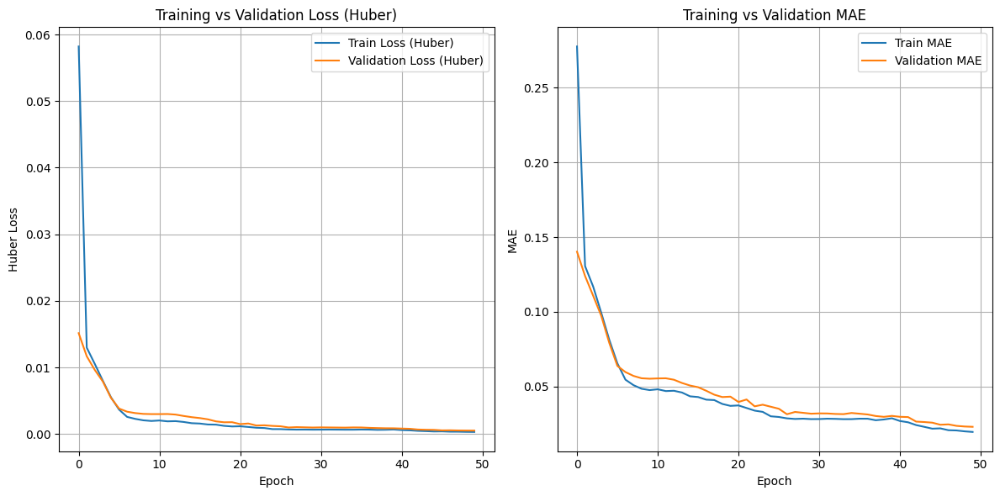

In [18]:
train_losses = np.load('metrics_grid/train_losses.npy', allow_pickle=True).tolist()
val_losses = np.load('metrics_grid/val_losses.npy', allow_pickle=True).tolist()
train_maes = np.load('metrics_grid/train_maes.npy', allow_pickle=True).tolist()
val_maes = np.load('metrics_grid/val_maes.npy', allow_pickle=True).tolist()

plt.figure(figsize=(12,6))

# Plot Loss (MSE)
plt.subplot(1,2,1)
plt.plot(train_losses, label="Train Loss (Huber)")
plt.plot(val_losses, label="Validation Loss (Huber)")
plt.xlabel("Epoch")
plt.ylabel("Huber Loss")
plt.title("Training vs Validation Loss (Huber)")
plt.legend()
plt.grid()

# Plot MAE
plt.subplot(1,2,2)
plt.plot(train_maes, label="Train MAE")
plt.plot(val_maes, label="Validation MAE")
plt.xlabel("Epoch")
plt.ylabel("MAE")
plt.title("Training vs Validation MAE")
plt.legend()
plt.grid()

plt.tight_layout()
plt.show()

In [19]:
# LOAD MODEL
model = nn.Sequential(
    feature_extractor,
    regressor
)

model.load_state_dict(torch.load("grid_model/grid_best.pth"))
model = model.to(device)

# TEST LOOP
model.eval()

all_images_grid = []
all_preds_grid = []
all_targets_grid = []
all_maes_grid = []

with torch.no_grad():
    for images, targets in tqdm(test_dataloader_grid, desc="Test set evaluation"):
        images = images.to(device)
        targets = targets.to(device)
        
        preds = model(images)
        loss = criterion(preds, targets)
        
        batch_mae = F.l1_loss(preds, targets, reduction='none') 
        batch_mae = batch_mae.mean(dim=1)  
        
        all_images_grid.append(images.cpu())
        all_preds_grid.append(preds.cpu())
        all_targets_grid.append(targets.cpu())
        all_maes_grid.append(batch_mae.cpu())

all_images_grid = torch.cat(all_images_grid)
all_preds_grid = torch.cat(all_preds_grid)
all_targets_grid = torch.cat(all_targets_grid)
all_maes_grid = torch.cat(all_maes_grid)

test_loss = F.mse_loss(all_preds_grid, all_targets_grid, reduction='mean').item()
test_mae = F.l1_loss(all_preds_grid, all_targets_grid, reduction='mean').item()

print(f"\n✅ FINAL TEST RESULTS:")
print(f"Test Loss (MSE): {test_loss:.6f}")
print(f"Test MAE: {test_mae:.6f}")


Test set evaluation: 100%|██████████| 10/10 [00:48<00:00,  4.80s/it]


✅ FINAL TEST RESULTS:
Test Loss (MSE): 0.000796
Test MAE: 0.021052


In [1]:
n_show = 5
sorted_indices = torch.argsort(all_maes_grid, descending=True)

for i in range(n_show):
    idx = sorted_indices[i].item()
    img = all_images_grid[idx].permute(1, 2, 0).numpy()  # CHW → HWC
    img = (img - img.min()) / (img.max() - img.min())

    img_h, img_w = img.shape[0], img.shape[1]
    
    pred_points_grid = all_preds_grid[idx].view(-1, 2).numpy()
    true_points_grid = all_targets_grid[idx].view(-1, 2).numpy()

    # Denormalize
    pred_points_grid = pred_points_grid * np.array([img_w, img_h])
    true_points_grid = true_points_grid * np.array([img_w, img_h])
    
    plt.figure(figsize=(6,6))
    plt.imshow(img)
    
    # Plot GT points (green)
    plt.scatter(true_points_grid[:,0], true_points_grid[:,1], color='green', label='Ground truth', s=50)
    
    # Plot predicted points (red x)
    plt.scatter(pred_points_grid[:,0], pred_points_grid[:,1], color='red', label='Prediction', marker='x', s=50)
    
    plt.title(f"Image {idx} | MAE: {all_maes_grid[idx]:.4f}")
    plt.legend()
    plt.show()


NameError: name 'torch' is not defined

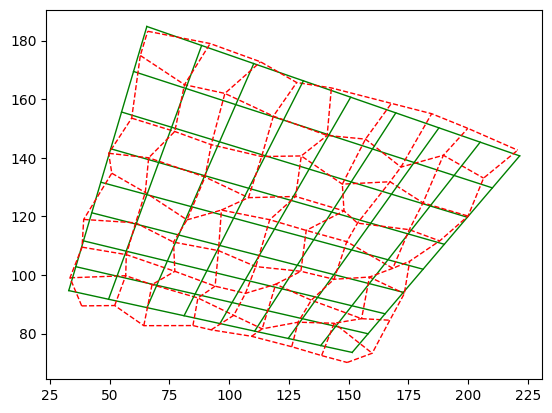

In [26]:
# Plot grid as lines (optional — looks cool)
grid_size = 9

# Plot rows
for i in range(grid_size):
    plt.plot(true_points_grid[i*grid_size:(i+1)*grid_size,0], true_points_grid[i*grid_size:(i+1)*grid_size,1], color='green', linewidth=1)
    plt.plot(pred_points_grid[i*grid_size:(i+1)*grid_size,0], pred_points_grid[i*grid_size:(i+1)*grid_size,1], color='red', linestyle='--', linewidth=1)

# Plot columns
for j in range(grid_size):
    plt.plot(true_points_grid[j::grid_size,0], true_points_grid[j::grid_size,1], color='green', linewidth=1)
    plt.plot(pred_points_grid[j::grid_size,0], pred_points_grid[j::grid_size,1], color='red', linestyle='--', linewidth=1)


# **Post Processing**

Inliers: 81 / 81


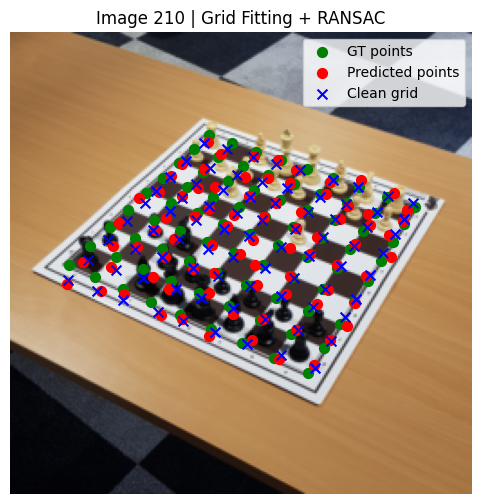

In [61]:
image_idx = 210  # Change this to visualize different images (152,206, 262, 210 are good candidates)

# Step 1 — Load points
pred_points_grid = all_preds_grid[image_idx].view(-1,2).numpy()  # (N,2)
true_points_grid = all_targets_grid[image_idx].view(-1,2).numpy()  # (N,2)

# Step 2 — Build ideal grid
grid_size = 9  # or your grid_size
xs = np.linspace(0, 1, grid_size)
ys = np.linspace(0, 1, grid_size)
grid_points_ideal = np.array([[x, y] for y in ys for x in xs], dtype=np.float32)

# Step 3 — RANSAC homography
H, mask = cv2.findHomography(pred_points_grid, grid_points_ideal, cv2.RANSAC)
pred_inliers = pred_points_grid[mask.ravel() == 1]
ideal_inliers = grid_points_ideal[mask.ravel() == 1]

print(f"Inliers: {len(pred_inliers)} / {len(pred_points_grid)}")

# Step 4 — Grid fitting
# We will fit lines using ALL pred_points (not just inliers) to preserve full grid structure.

# Fit horizontal lines
fitted_h_lines = []
for i in range(grid_size):
    line_pts = pred_points_grid[i*grid_size : (i+1)*grid_size]
    line_pts_cv = line_pts.reshape(-1,1,2).astype(np.float32)
    
    vx, vy, x0, y0 = cv2.fitLine(line_pts_cv, cv2.DIST_L2, 0, 0.01, 0.01)
    fitted_h_lines.append((vx, vy, x0, y0))

# Fit vertical lines
fitted_v_lines = []
for j in range(grid_size):
    line_pts = pred_points_grid[j::grid_size]
    line_pts_cv = line_pts.reshape(-1,1,2).astype(np.float32)
    
    vx, vy, x0, y0 = cv2.fitLine(line_pts_cv, cv2.DIST_L2, 0, 0.01, 0.01)
    fitted_v_lines.append((vx, vy, x0, y0))

# Function to compute intersection of two lines
def compute_intersection(vx1, vy1, x1, y1, vx2, vy2, x2, y2):
    # Line1: (x - x1) / vx1 = (y - y1) / vy1
    # Line2: (x - x2) / vx2 = (y - y2) / vy2
    
    # Solve linear system:
    # A x + B y = C
    # D x + E y = F

    A = vy1
    B = -vx1
    C = vy1 * x1 - vx1 * y1

    D = vy2
    E = -vx2
    F = vy2 * x2 - vx2 * y2

    denom = A * E - B * D
    if abs(denom) < 1e-6:
        return np.array([np.nan, np.nan])  # Lines are parallel or very close → skip
    
    x = (C * E - B * F) / denom
    y = (A * F - C * D) / denom
    return np.array([x, y])

# Step 5 — Build clean grid points from intersections
clean_grid_points = []

for i in range(grid_size):
    vx_h, vy_h, x0_h, y0_h = fitted_h_lines[i]
    
    for j in range(grid_size):
        vx_v, vy_v, x0_v, y0_v = fitted_v_lines[j]
        
        pt = compute_intersection(vx_h, vy_h, x0_h, y0_h, vx_v, vy_v, x0_v, y0_v)
        clean_grid_points.append(pt)

clean_grid_points = np.stack(clean_grid_points).astype(np.float32)
clean_grid_points = np.squeeze(clean_grid_points)

# Step 6 — Final homography
H_clean, _ = cv2.findHomography(clean_grid_points, grid_points_ideal, cv2.LMEDS)

mean = np.array([0.485, 0.456, 0.406])
std = np.array([0.229, 0.224, 0.225])

img = all_images_grid[image_idx].permute(1, 2, 0).numpy()  # CHW → HWC
img = (img * std + mean)
img = np.clip(img, 0, 1)  # Ensure valid range


# Step 7 — Plot for visual inspection
plt.figure(figsize=(6,6))
plt.imshow(img)
plt.scatter(true_points_grid[:,0] * all_images_grid[image_idx].shape[2],
            true_points_grid[:,1] * all_images_grid[image_idx].shape[1], color='green', label='GT points', s=50)
plt.scatter(pred_points_grid[:,0] * all_images_grid[image_idx].shape[2],
            pred_points_grid[:,1] * all_images_grid[image_idx].shape[1], color='red', label='Predicted points', s=50)
plt.scatter(clean_grid_points[:,0] * all_images_grid[image_idx].shape[2],
            clean_grid_points[:,1] * all_images_grid[image_idx].shape[1], color='blue', label='Clean grid', s=50, marker='x')
plt.title(f"Image {image_idx} | Grid Fitting + RANSAC")
plt.legend()
plt.axis('off')
plt.show()


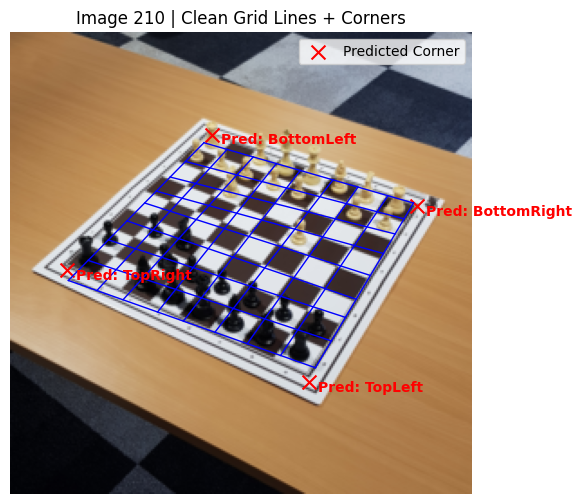

In [62]:
img_h, img_w = img.shape[0], img.shape[1]

# Denormalize points to pixels
clean_grid_px = clean_grid_points.copy()
clean_grid_px[:,0] *= img_w
clean_grid_px[:,1] *= img_h

# Denormalize corners to pixels
corners_pred = all_preds_corners[image_idx].cpu().numpy().reshape(4,2)
corners_px = corners_pred.copy()
corners_px[:,0] *= img_w
corners_px[:,1] *= img_h

# Plot
plt.figure(figsize=(6,6))
plt.imshow(img)

# Plot horizontal lines
for i in range(grid_size):
    row_pts = clean_grid_px[i*grid_size : (i+1)*grid_size]
    plt.plot(row_pts[:,0], row_pts[:,1], color='blue', linewidth=1)

# Plot vertical lines
for j in range(grid_size):
    col_pts = clean_grid_px[j::grid_size]
    plt.plot(col_pts[:,0], col_pts[:,1], color='blue', linewidth=1)

# Plot corners predicted
for i in range(4):
    x, y = corners_px[i]
    plt.scatter(x, y, color='red', marker='x', s=100, label='Predicted Corner' if i == 0 else "")
    plt.text(x+5, y+5, f"Pred: {corner_labels[i]}", color='red', fontsize=10, weight='bold')

plt.title(f"Image {image_idx} | Clean Grid Lines + Corners")
plt.legend()
plt.axis('off')
plt.show()


# **Detecting Grid were kinda bad, if the model changed small positions of the predicted corners, the grid was not detected correctly, so we decided to use only the corners to generate the grid.**


image 1/1 c:\Users\diogo\OneDrive - Universidade do Porto\Universidade\4-2\VC\proj\VC2\images\0\G000_IMG069.jpg: 640x640 3 white-pawns, 2 white-rooks, 1 white-knight, 1 white-king, 4 black-pawns, 2 black-rooks, 1 black-knight, 1 black-king, 53.1ms
Speed: 5.5ms preprocess, 53.1ms inference, 180.8ms postprocess per image at shape (1, 3, 640, 640)


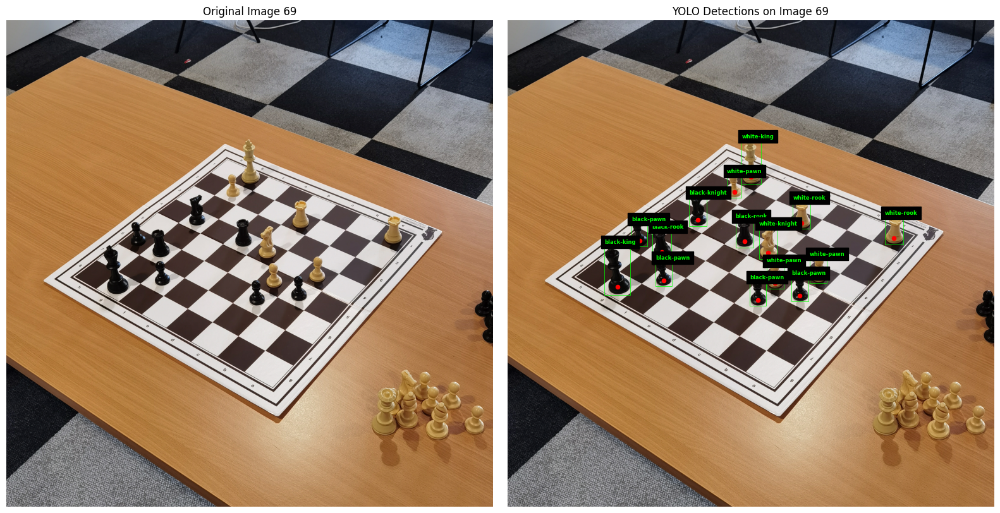

In [24]:
partition = 'test' 
image_idx = 69  # Change this to visualize different images (152,206, 262, 210, 101 are good candidates)
root_dir = ''

with open(os.path.join(root_dir, 'annotations.json'), 'r') as f:
    anns = json.load(f)


images = anns['images']
split_ids = anns['splits']['chessred2k'][partition]['image_ids']
image_id_to_path = {img['id']: img['path'] for img in images}
image_ids = [img_id for img_id in split_ids]
img_id = image_ids[image_idx]

img_path = os.path.join('', image_id_to_path[img_id])

# Load model
yolo_model = YOLO('runs/train/piece_yolov8/weights/best.pt')

# Run YOLO predict
results = yolo_model.predict(source=img_path, conf=0.25, iou=0.45)

# Get image used by YOLO for plotting bboxes
img = results[0].orig_img
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert to RGB for matplotlib

# Also load original image to compare
img_original = cv2.imread(img_path)
img_original = cv2.cvtColor(img_original, cv2.COLOR_BGR2RGB)

# Get boxes and class ids
boxes = results[0].boxes.xyxy.cpu().numpy()  # (N, 4) → x1,y1,x2,y2 in pixels
class_ids = results[0].boxes.cls.cpu().numpy().astype(int)

fig, axs = plt.subplots(1, 2, figsize=(16,8))

axs[0].imshow(img_original)
axs[0].axis('off')
axs[0].set_title(f"Original Image {img_id}")

axs[1].imshow(img)
axs[1].axis('off')
axs[1].set_title(f"YOLO Detections on Image {img_id}")

alpha = 0.9

base_points = []

for i in range(len(boxes)):
    x1, y1, x2, y2 = boxes[i]
    w = x2 - x1
    h = y2 - y1

    x_base = (x1 + x2) / 2
    y_base = y1 + alpha * (y2 - y1) - 20
    
    base_points.append({
        'x_base': x_base,
        'y_base': y_base,
        'class_id': class_ids[i],
        'name': yolo_model.names[class_ids[i]]
    })

    # Get label name
    label = yolo_model.names[class_ids[i]]
    
    # Draw rectangle
    rect = patches.Rectangle((x1, y1), w, h, linewidth=0.5, edgecolor='lime', facecolor='none')
    axs[1].add_patch(rect)
    
    # Draw label
    axs[1].text(x1, y1 - 5, f'{label}', color='lime', fontsize=6, weight='bold', backgroundcolor='black')

    # Draw base point
    axs[1].scatter(x_base, y_base, color='red', s=20, label='Base Point' if i == 0 else "")

plt.tight_layout()
plt.show()


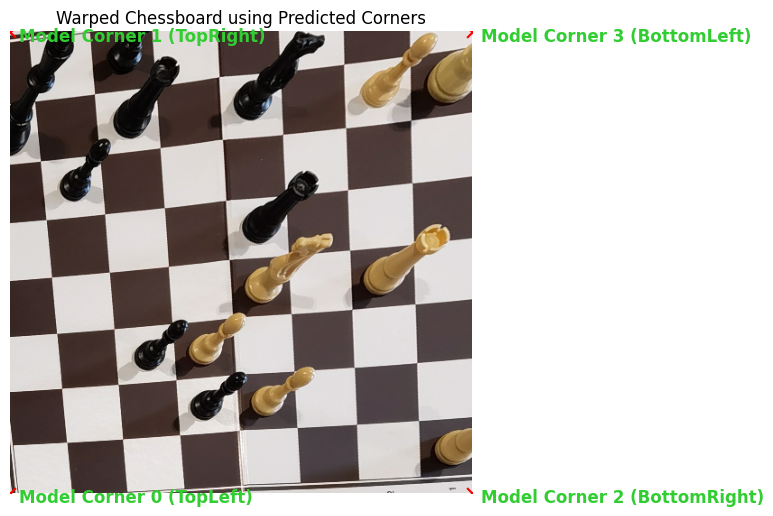

Predicted Corners (normalized):
Model Corner 0 (TopLeft): 0.5350, 0.7585
Model Corner 1 (TopRight): 0.1648, 0.4994
Model Corner 2 (BottomRight): 0.8460, 0.4562
Model Corner 3 (BottomLeft): 0.4818, 0.3030

Ordered corners used for homography (pixels):
TopRight (Model Corner 1): 506.3, 1534.3
BottomLeft (Model Corner 3): 1480.2, 930.7
BottomRight (Model Corner 2): 2599.0, 1401.3
TopLeft (Model Corner 0): 1643.5, 2330.1


In [25]:
def order_corners_with_index(corners):
    cx = np.mean(corners[:,0])
    cy = np.mean(corners[:,1])
    
    angles = np.arctan2(corners[:,1] - cy, corners[:,0] - cx)
    
    ordered_idx = np.argsort(angles)
    ordered_corners = corners[ordered_idx]
    
    s = ordered_corners.sum(axis=1)
    min_idx = np.argmin(s)
    ordered_corners = np.roll(ordered_corners, -min_idx, axis=0)
    ordered_idx = np.roll(ordered_idx, -min_idx)
    
    return ordered_corners, ordered_idx

def warp_chessboard(img, pred_corners, img_w, img_h, output_size=512):
    corners_px = pred_corners.copy()
    corners_px[:,0] *= img_w
    corners_px[:,1] *= img_h
    
    src_pts, ordered_idx = order_corners_with_index(corners_px)
    
    dst_pts = np.array([
        [0, 0],                          # TopLeft
        [output_size-1, 0],              # TopRight
        [output_size-1, output_size-1],  # BottomRight
        [0, output_size-1]               # BottomLeft
    ], dtype=np.float32)
    
    H, _ = cv2.findHomography(src_pts.astype(np.float32), dst_pts)
    
    warped_img = cv2.warpPerspective(img, H, (output_size, output_size))
    
    return warped_img, H, src_pts, dst_pts, ordered_idx

corners_pred = all_preds_corners[image_idx].cpu().numpy().reshape(4,2)

img_h, img_w = img.shape[0], img.shape[1]

warped_img, H, src_pts, dst_pts, ordered_idx = warp_chessboard(img, corners_pred, img_w, img_h, output_size=512)

# === Plot result ===

model_corner_labels = ['TopLeft', 'TopRight', 'BottomRight', 'BottomLeft']

plt.figure(figsize=(6,6))
plt.imshow(warped_img)
plt.title("Warped Chessboard using Predicted Corners")

for i, (x, y) in enumerate(dst_pts):
    model_idx = ordered_idx[i] 
    model_label = model_corner_labels[model_idx]
    
    plt.scatter(x, y, color='red', s=60, marker='x')
    plt.text(x + 10, y + 10, f"Model Corner {model_idx} ({model_label})", color='limegreen', fontsize=12, weight='bold')

plt.axis('off')
plt.show()


print("Predicted Corners (normalized):")
for i, corner in enumerate(corners_pred):
    print(f"Model Corner {i} ({model_corner_labels[i]}): {corner[0]:.4f}, {corner[1]:.4f}")

print("\nOrdered corners used for homography (pixels):")
for i, corner in enumerate(src_pts):
    model_idx = ordered_idx[i]
    model_label = model_corner_labels[model_idx]
    print(f"{model_label} (Model Corner {model_idx}): {corner[0]:.1f}, {corner[1]:.1f}")


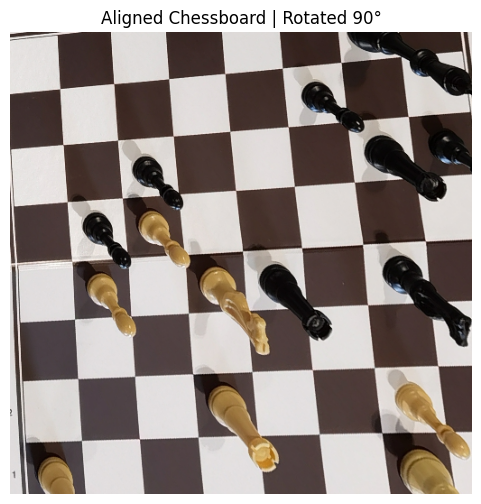

In [26]:
# Determine where Model Corner 0 went
corner_pos_of_model0 = np.where(ordered_idx == 0)[0][0]

# Determine how many times to rotate 90 degrees
rot_times = {0: 0, 1: 3, 2: 2, 3: 1}[corner_pos_of_model0]

warped_img_aligned = np.rot90(warped_img, k=rot_times*3)

plt.figure(figsize=(6,6))
plt.imshow(warped_img_aligned)
plt.title(f"Aligned Chessboard | Rotated {rot_times * 90}°")
plt.axis('off')
plt.show()

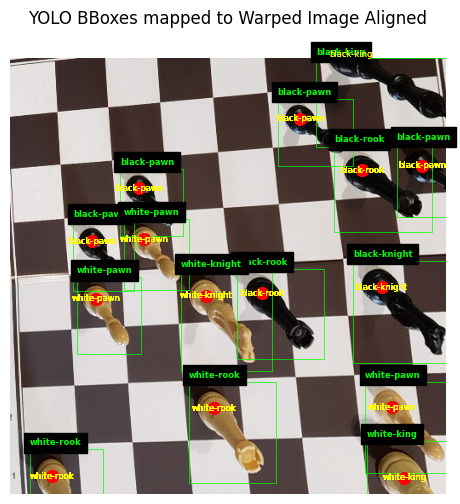

In [27]:
output_size = warped_img_aligned.shape[0]   

def rotate_point(x, y, k, size):
    for _ in range(k):
        x, y = y, size - x
    return x, y

warped_bboxes_aligned = []

for i in range(len(boxes)):
    x1, y1, x2, y2 = boxes[i]
    
    corners = np.array([
        [x1, y1, 1],
        [x2, y1, 1],
        [x2, y2, 1],
        [x1, y2, 1]
    ]).T  # shape (3, 4)
    
    warped_corners = H @ corners  
    warped_corners /= warped_corners[2, :] 
    
    x_warped = warped_corners[0, :]
    y_warped = warped_corners[1, :]
    
    x_rotated = []
    y_rotated = []
    
    for j in range(4):
        x_r, y_r = rotate_point(x_warped[j], y_warped[j], rot_times*3, output_size)
        x_r = np.clip(x_r, 0, output_size-1)
        y_r = np.clip(y_r, 0, output_size-1)
        x_rotated.append(x_r)
        y_rotated.append(y_r)
    
    x1_final = np.min(x_rotated)
    y1_final = np.min(y_rotated)
    x2_final = np.max(x_rotated)
    y2_final = np.max(y_rotated)
    
    warped_bboxes_aligned.append({
        'x1': x1_final,
        'y1': y1_final,
        'x2': x2_final,
        'y2': y2_final,
        'class_id': class_ids[i]
    })

fig, ax = plt.subplots(1, figsize=(6,6))
ax.imshow(warped_img_aligned)
ax.axis('off')

for bbox in warped_bboxes_aligned:
    x1 = bbox['x1']
    y1 = bbox['y1']
    w = bbox['x2'] - x1
    h = bbox['y2'] - y1
    
    # Display base points
    for base_point in base_points:
        # Apply homography
        p = np.array([base_point['x_base'], base_point['y_base'], 1]).reshape(3,1)
        p_warped = H @ p
        p_warped /= p_warped[2,0]
        
        x_warped = p_warped[0,0]
        y_warped = p_warped[1,0]
        
        # Apply rotation
        x_rotated, y_rotated = rotate_point(x_warped, y_warped, rot_times*3, output_size)
        
        # Draw point (ex: red circle)
        ax.scatter(x_rotated, y_rotated, color='red', s=60, marker='o')
        
        # Optionally draw name of piece
        ax.text(x_rotated, y_rotated, f'{base_point["name"]}', color='yellow', fontsize=6, ha='center', va='center')

    
    # Get label name
    label = yolo_model.names[bbox['class_id']]
    
    # Draw rectangle
    rect = patches.Rectangle((x1, y1), w, h, linewidth=0.5, edgecolor='lime', facecolor='none')
    ax.add_patch(rect)
    
    # Add label
    ax.text(x1, y1 - 5, f'{label}', color='lime', fontsize=6, weight='bold', backgroundcolor='black')


plt.title("YOLO BBoxes mapped to Warped Image Aligned")
plt.show()

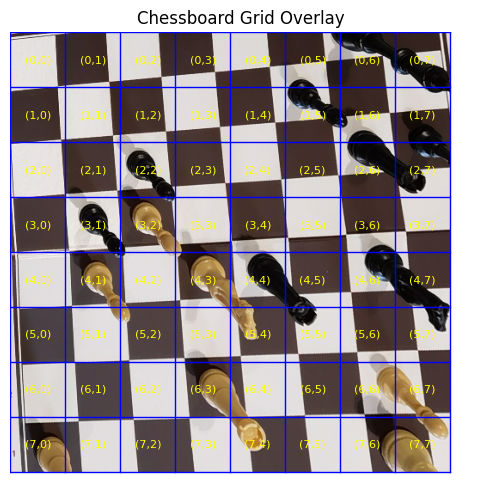

In [28]:
cell_size = output_size / 8

plt.figure(figsize=(6,6))
plt.imshow(warped_img_aligned)
plt.title("Chessboard Grid Overlay")
plt.axis('off')

for i in range(9):
    y = i * cell_size
    plt.plot([0, output_size], [y, y], color='blue', linewidth=1)

for j in range(9):
    x = j * cell_size
    plt.plot([x, x], [0, output_size], color='blue', linewidth=1)

for row in range(8):
    for col in range(8):
        x_center = (col + 0.5) * cell_size
        y_center = (row + 0.5) * cell_size
        plt.text(x_center, y_center, f'({row},{col})', color='yellow', ha='center', va='center', fontsize=8)

plt.show()

In [29]:
cell_size = output_size / 8  # 512 / 8 = 64 px  

mapped_positions = []

for base_point in base_points:
    # Apply homography to (x_base, y_base)
    p = np.array([base_point['x_base'], base_point['y_base'], 1]).reshape(3,1)
    p_warped = H @ p
    p_warped /= p_warped[2,0]
    
    x_warped = p_warped[0,0]
    y_warped = p_warped[1,0]
    
    # Apply rotation
    x_rotated, y_rotated = rotate_point(x_warped, y_warped, rot_times*3, output_size)
    
    # Map to grid
    col = int(x_rotated // cell_size)
    row = int(y_rotated // cell_size)
    
    # Clip to grid bounds
    row = np.clip(row, 0, 7)
    col = np.clip(col, 0, 7)
    
    # Save mapped position
    mapped_positions.append({
        'row': row,
        'col': col,
        'name': base_point['name'],
        'class_id': base_point['class_id'],
        'x_rotated': x_rotated,
        'y_rotated': y_rotated
    })

# === Print result ===
print("\nDetected pieces mapped to board cells (using base points + H + rotation):")
for piece in mapped_positions:
    print(f"{piece['name']} → Cell ({piece['row']},{piece['col']}) → rotated=({piece['x_rotated']:.1f},{piece['y_rotated']:.1f})")


Detected pieces mapped to board cells (using base points + H + rotation):
black-rook → Cell (2,6) → rotated=(412.6,131.1)
white-rook → Cell (6,3) → rotated=(238.8,410.6)
black-rook → Cell (4,4) → rotated=(295.4,275.3)
black-pawn → Cell (2,2) → rotated=(151.2,152.1)
black-knight → Cell (4,6) → rotated=(436.1,268.4)
black-pawn → Cell (3,1) → rotated=(96.1,214.6)
black-pawn → Cell (1,7) → rotated=(483.8,125.9)
white-knight → Cell (4,3) → rotated=(229.2,278.4)
white-pawn → Cell (3,2) → rotated=(157.0,212.6)
white-rook → Cell (7,0) → rotated=(48.8,490.1)
white-pawn → Cell (4,1) → rotated=(100.8,282.0)
black-pawn → Cell (1,5) → rotated=(340.0,70.6)
black-king → Cell (0,6) → rotated=(399.7,-5.3)
white-pawn → Cell (6,6) → rotated=(447.7,409.8)
white-king → Cell (7,7) → rotated=(462.5,492.2)


In [30]:
# Initialize empty board (8x8) with 'empty'
board_state = [['empty' for _ in range(8)] for _ in range(8)]

# Fill board with detected pieces
for piece in mapped_positions:
    row = piece['row']
    col = piece['col']
    label = piece['name']
    
    # Set piece in board
    board_state[row][col] = label

# === Print board nicely ===
print("\nBoard State (top-left is [0,0]):")
for row in board_state:
    print(row)



Board State (top-left is [0,0]):
['empty', 'empty', 'empty', 'empty', 'empty', 'empty', 'black-king', 'empty']
['empty', 'empty', 'empty', 'empty', 'empty', 'black-pawn', 'empty', 'black-pawn']
['empty', 'empty', 'black-pawn', 'empty', 'empty', 'empty', 'black-rook', 'empty']
['empty', 'black-pawn', 'white-pawn', 'empty', 'empty', 'empty', 'empty', 'empty']
['empty', 'white-pawn', 'empty', 'white-knight', 'black-rook', 'empty', 'black-knight', 'empty']
['empty', 'empty', 'empty', 'empty', 'empty', 'empty', 'empty', 'empty']
['empty', 'empty', 'empty', 'white-rook', 'empty', 'empty', 'white-pawn', 'empty']
['white-rook', 'empty', 'empty', 'empty', 'empty', 'empty', 'empty', 'white-king']


Loaded image for piece 'black-king' from 'pieces_png/black-king.png'
Loaded image for piece 'black-knight' from 'pieces_png/black-knight.png'
Loaded image for piece 'white-knight' from 'pieces_png/white-knight.png'
Loaded image for piece 'black-pawn' from 'pieces_png/black-pawn.png'
Loaded image for piece 'white-rook' from 'pieces_png/white-rook.png'
Loaded image for piece 'black-rook' from 'pieces_png/black-rook.png'
Loaded image for piece 'white-pawn' from 'pieces_png/white-pawn.png'
Loaded image for piece 'white-king' from 'pieces_png/white-king.png'


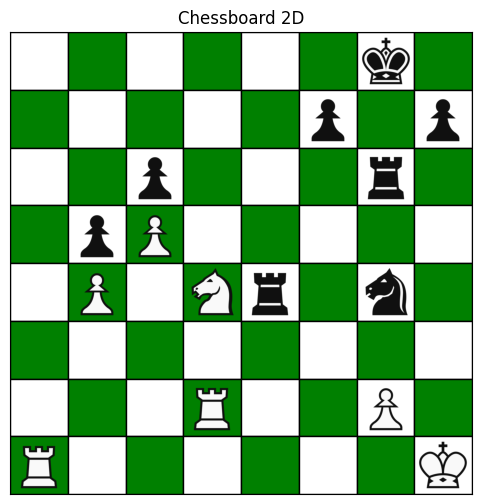

In [31]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.image as mpimg

# Folder where PNGs estão
piece_image_folder = 'pieces_png/'

# Load all piece images
piece_images = {}

for piece_name in set(piece['name'] for piece in mapped_positions):
    image_path = piece_image_folder + piece_name + '.png'
    piece_images[piece_name] = mpimg.imread(image_path)
    print(f"Loaded image for piece '{piece_name}' from '{image_path}'")

# Draw board
fig, ax = plt.subplots(figsize=(6,6))

# Draw squares
for row in range(8):
    for col in range(8):
        color = 'white' if (row + col) % 2 == 0 else 'green'
        rect = patches.Rectangle((col, 7-row), 1, 1, linewidth=1, edgecolor='black', facecolor=color)
        ax.add_patch(rect)

# Draw pieces
for piece in mapped_positions:
    row = piece['row']
    col = piece['col']
    label = piece['name']
    
    img_piece = piece_images[label]
    
    ax.imshow(img_piece, extent=[col, col+1, 7-row, 7-row+1], zorder=10)

# Styling
ax.set_xlim(0,8)
ax.set_ylim(0,8)
ax.set_xticks([])
ax.set_yticks([])
ax.set_aspect('equal')
plt.title("Chessboard 2D")
plt.show()


# **TRY Mask R-CNN, but it would only difficult even more the pipeline, cause it only masks the board, doesnt get the corners correctly.**

In [38]:
class CocoBoardDataset(Dataset):
    def __init__(self, root_dir, partition, transform=None):
        self.root_dir = root_dir
        self.transform = transform

        with open(os.path.join(root_dir, 'annotations.json'), 'r') as f:
            anns = json.load(f)

        self.images = anns['images']
        self.corners = anns['annotations']['corners']
        self.split_ids = anns['splits']['chessred2k'][partition]['image_ids']

        # Filter images to current split
        self.images = [img for img in self.images if img['id'] in self.split_ids]
        self.image_id_to_path = {img['id']: img['path'] for img in self.images}

        # Group corners by image_id
        self.corners_by_image = {}
        for ann in self.corners:
            self.corners_by_image[ann['image_id']] = ann['corners']

        self.image_ids = list(self.image_id_to_path.keys())

        print(f"Number of {partition} images (board masks): {len(self.image_ids)}")

    def __len__(self):
        return len(self.image_ids)

    def __getitem__(self, idx):
        img_id = self.image_ids[idx]
        img_path = os.path.join(self.root_dir, self.image_id_to_path[img_id])

        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        orig_height, orig_width = image.shape[:2]

        image = image.astype(np.float32) / 255.0

        if self.transform:
            image = self.transform(image)
        else:
            image = torch.tensor(image).permute(2, 0, 1).float()

        corners_dict = self.corners_by_image[img_id]

        polygon = np.array([
            corners_dict['top_left'],
            corners_dict['top_right'],
            corners_dict['bottom_right'],
            corners_dict['bottom_left']
        ], dtype=np.int32)

        # Generate mask
        mask = np.zeros((orig_height, orig_width), dtype=np.uint8)
        cv2.fillPoly(mask, [polygon], 1)  # Mask will have values 0 or 1

        x_min = np.min(polygon[:, 0])
        y_min = np.min(polygon[:, 1])
        x_max = np.max(polygon[:, 0])
        y_max = np.max(polygon[:, 1])

        boxes = torch.tensor([[x_min, y_min, x_max, y_max]], dtype=torch.float32)
        labels = torch.tensor([1], dtype=torch.int64)  # 1 class: board
        masks = torch.tensor(mask[None, ...], dtype=torch.uint8)  # Shape (1, H, W)

        target = {
            "boxes": boxes,
            "labels": labels,
            "masks": masks,
            "image_id": torch.tensor([img_id])
        }

        return image, target

In [ ]:
def collate_fn(batch):
    return tuple(zip(*batch))

root_dir = ''
batch_size = 8
num_workers = 0

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

train_dataset_board = CocoBoardDataset(root_dir, partition='train', transform=data_aug)
valid_dataset_board = CocoBoardDataset(root_dir, partition='val', transform=data_in)
test_dataset_board = CocoBoardDataset(root_dir, partition='test', transform=data_in)

train_dataloader_board = DataLoader(train_dataset_board, batch_size=batch_size, shuffle=True, num_workers=num_workers, collate_fn=collate_fn)
valid_dataloader_board = DataLoader(valid_dataset_board, batch_size=batch_size, shuffle=False, num_workers=num_workers, collate_fn=collate_fn)
test_dataloader_board = DataLoader(test_dataset_board, batch_size=batch_size, shuffle=False, num_workers=num_workers, collate_fn=collate_fn)

Using device: cuda
Number of train images (board masks): 1442
Number of val images (board masks): 330
Number of test images (board masks): 306


In [40]:
model = torchvision.models.detection.maskrcnn_resnet50_fpn(weights='DEFAULT')

in_features_box = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(in_features_box, 2)

in_features_mask = model.roi_heads.mask_predictor.conv5_mask.in_channels
hidden_layer = 256
model.roi_heads.mask_predictor = MaskRCNNPredictor(in_features_mask, hidden_layer, 2)

model.to(device)

params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.AdamW(params, lr=2.5e-5)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=2, verbose=True)

c:\Users\diogo\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


In [ ]:
# === IoU computation function ===
def compute_iou(pred_mask, target_mask):
    intersection = (pred_mask & target_mask).float().sum()
    union = (pred_mask | target_mask).float().sum()
    iou = intersection / union if union > 0 else 0.0
    return iou.item()

# === Training loop
num_epochs = 50
patience = 5
epochs_no_improvement = 0

train_losses = []
val_losses = []
train_ious = []
val_ious = []
best_val_loss = float('inf')

for epoch in range(num_epochs):
    ##########################
    # TRAIN LOOP
    ##########################
    model.train()
    running_loss = 0.0
    
    for images, targets in tqdm(train_dataloader_board, desc=f"Epoch {epoch+1}/{num_epochs} [Training]"):
        images = list(img.to(device) for img in images)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        loss_dict = model(images, targets)
        loss = sum(loss for loss in loss_dict.values())

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * len(images)

    epoch_train_loss = running_loss / len(train_dataloader_board.dataset)

    ##########################
    # VALIDATION LOOP
    ##########################
    model.eval()
    val_loss = 0.0
    val_iou = 0.0

    with torch.no_grad():
        for images, targets in tqdm(valid_dataloader_board, desc=f"Epoch {epoch+1}/{num_epochs} [Validation]"):
            images = list(img.to(device) for img in images)
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

            loss_dict = model(images, targets)
            loss = sum(loss for loss in loss_dict.values())

            val_loss += loss.item() * len(images)

            batch_ious = []
            preds = model(images)
            for pred, target in zip(preds, targets):
                if len(pred["masks"]) == 0:
                    continue
                pred_mask = (pred["masks"][0, 0] > 0.5).cpu().int()
                gt_mask = (target["masks"][0] > 0.5).cpu().int()
                iou = compute_iou(pred_mask, gt_mask)
                batch_ious.append(iou)
            if len(batch_ious) > 0:
                val_iou += np.mean(batch_ious) * len(images)

    epoch_val_loss = val_loss / len(valid_dataloader_board.dataset)
    epoch_val_iou = val_iou / len(valid_dataloader_board.dataset)

    scheduler.step(epoch_val_loss)

    ##########################
    # Save metrics
    ##########################
    train_losses.append(epoch_train_loss)
    val_losses.append(epoch_val_loss)
    val_ious.append(epoch_val_iou)

    ##########################
    # Save best model
    ##########################
    if epoch_val_loss < best_val_loss:
        print(f"🔥 New best model found at epoch {epoch+1} with validation loss {epoch_val_loss:.6f} - saving model.")
        best_val_loss = epoch_val_loss
        os.makedirs("board_model", exist_ok=True)
        torch.save(model.state_dict(), f"board_model/maskrcnn_best.pth")

        epochs_no_improvement = 0
    else:
        epochs_no_improvement += 1
        if epochs_no_improvement >= patience:
            print(f"⏳ Early stopping triggered after {patience} epochs without improvement.")
            break

    ##########################
    # Print epoch summary
    ##########################
    print(f"Epoch [{epoch+1}/{num_epochs}] - "
          f"Train Loss: {epoch_train_loss:.6f} - "
          f"Val Loss: {epoch_val_loss:.6f} - Val IoU: {epoch_val_iou:.6f} - "
          f"LR: {scheduler.optimizer.param_groups[0]['lr']:.6f}")

# === Save metrics
os.makedirs("metrics_board", exist_ok=True)
np.save("metrics_board/train_losses.npy", np.array(train_losses))
np.save("metrics_board/val_losses.npy", np.array(val_losses))
np.save("metrics_board/val_ious.npy", np.array(val_ious))

print("✅ Metrics saved to 'metrics_board' folder.")


Epoch 1/50 [Training]:   1%|          | 1/181 [00:43<2:10:58, 43.66s/it]

In [ ]:
train_losses = np.load('metrics_board/train_losses.npy')
val_losses = np.load('metrics_board/val_losses.npy')
train_ious = np.load('metrics_board/train_ious.npy')
val_ious = np.load('metrics_board/val_ious.npy')


plt.figure(figsize=(8,6))
plt.subplot(1,2,1)
plt.plot(train_losses, label='Train Loss', color='blue')
plt.plot(val_losses, label='Validation Loss', color='orange')
plt.title('Train vs Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.subplot(1,2,2)
plt.plot(train_ious, label='Train IoU', color='green')
plt.plot(val_ious, label='Validation IoU', color='red')
plt.title('Train vs Validation IoU')
plt.xlabel('Epoch')
plt.ylabel('IoU')
plt.legend()
plt.tight_layout()
plt.show()

In [ ]:
# === LOAD MODEL for TEST
model = torchvision.models.detection.maskrcnn_resnet50_fpn(weights='DEFAULT')

# Fine-tuning heads
in_features_box = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(in_features_box, 2)

in_features_mask = model.roi_heads.mask_predictor.conv5_mask.in_channels
hidden_layer = 256
model.roi_heads.mask_predictor = MaskRCNNPredictor(in_features_mask, hidden_layer, 2)

model.load_state_dict(torch.load("board_model/maskrcnn_best.pth"))
model = model.to(device)

# === TEST LOOP
model.eval()

all_images = []
all_preds_masks = []
all_gt_masks = []
all_ious = []

with torch.no_grad():
    for images, targets in tqdm(test_dataloader_board, desc="Test set evaluation"):
        images = list(img.to(device) for img in images)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        # Forward pass
        preds = model(images)

        # For each image in batch
        for img, pred, target in zip(images, preds, targets):
            if len(pred["masks"]) == 0:
                continue 

            # === Get predicted mask → use first mask or largest one
            if len(pred["masks"]) > 1:
                areas = [(m[0]>0.5).sum().item() for m in pred["masks"]]
                max_idx = np.argmax(areas)
                pred_mask = (pred["masks"][max_idx, 0] > 0.5).cpu().int()
            else:
                pred_mask = (pred["masks"][0, 0] > 0.5).cpu().int()

            # === Get ground-truth mask
            gt_mask = (target["masks"][0] > 0.5).cpu().int()

            # === Compute IoU
            iou = compute_iou(pred_mask, gt_mask)
            all_ious.append(iou)

            # === Save for analysis if needed
            all_images.append(img.cpu())
            all_preds_masks.append(pred_mask.cpu())
            all_gt_masks.append(gt_mask.cpu())

# === Aggregate results
all_ious = np.array(all_ious)

mean_iou = np.mean(all_ious) if len(all_ious) > 0 else 0.0

# === Print final results
print(f"\n✅ FINAL TEST RESULTS:")
print(f"Test Mean IoU: {mean_iou:.6f}")
print(f"Number of samples evaluated: {len(all_ious)}")
